<a href="https://www.kaggle.com/code/gregoryoliveira/brazil-climate-change-part-iii-stations-eda?scriptVersionId=105744484" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

# 0. Summary

- Purpose: impute missing values in automatic weather stations from Brazilian cities around the country;

- Main question: is it possible to impute weather data?;

- Techniques: exploratory data analysis, data vizualization, storytelling, timeseries analysis, and data imputation;

- Language: python;

- Libraries: pandas, seaborn, matplotlib, and scikit-learn;

# 1. Introduction

[Climate](https://en.wikipedia.org/wiki/Climate) change is real. There are a lot of studies done about it and we do not want to prove it or measure how strong it is. On this way, the purpose of this notebook is applied machine learning (ML) techniques to compare climate change between cities in Brazil. However, considering that some data is missing, we will first impute it on this notebook and them we will try to cluster the cities considering their timeseries.

This notebook was write as part of [Applied Data Science with Python Specialization](https://www.coursera.org/specializations/data-science-python), especially the 2nd course [Applied Plotting, Charting & Data Representation in Python](https://www.coursera.org/learn/python-plotting?specialization=data-science-python).

"This assignment requires that you to find at least two datasets on the web which are related, and that you visualize these datasets to answer a question with the broad topic of weather phenomena (see below) for the region of Juiz de Fora, Minas Gerais, Brazil, or Brazil more broadly."

I choose to create this notebook using [INMET](https://portal.inmet.gov.br/dadoshistoricos) (National Institute of Meteorology - Instituto Nacional de Meteorologia) data. The first version of the first notebook was built with Kaggle dataset [Brazil Weather, Automatic Stations (2000-2021)](https://www.kaggle.com/datasets/saraivaufc/automatic-weather-stations-brazil). However, considering that I want updated data, I code [the first part](https://www.kaggle.com/code/gregoryoliveira/brazil-weather-change-part-i-data-collection) to collect the data and summarize. The data is also avaiable as [Brazil Weather Information by INMET](https://www.kaggle.com/datasets/gregoryoliveira/brazil-weather-information-by-inmet). I will talk more about the second notebook on next secctions.

Differently the first two notebooks, I will apply in this kernel other structure, more data analytic techniques, and better coding strategies. The next section will briefly describe the steps in this work. However, before we start, let us look on automatic weather stations start-up in Brazil. We use the last record to indicate if stations are online. However, considering online the data available, it is impossible to say if a station is deactivated or just in maintenance.

In [1]:
"""Using pycodestyle + bnpep8 to analyze me code.
You can see more information at https://github.com/nbpep8/nbpep8 or
https://www.kaggle.com/code/debanga/kaggle-pep8-test/notebook
---
I will delete the pep8(_ih) function after fix all recommends.
This is my first time using this package.
"""
!pip install pycodestyle
!pip install --index-url https://test.pypi.org/simple/ nbpep8

import warnings
import numpy as np
import pandas as pd
import seaborn as sns
from nbpep8.nbpep8 import pep8
import matplotlib.pyplot as plt
from IPython.display import display, Markdown, HTML
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import TimeSeriesSplit, cross_val_score

warnings.filterwarnings('ignore')

Looking in indexes: https://test.pypi.org/simple/


In [2]:
from matplotlib import rcParams
rcParams['figure.dpi'] = 125
rcParams['figure.figsize'] = 12, 4
rcParams['figure.autolayout'] = True
rcParams['axes.titlelocation'] = 'left'

# To remove rcParams
#plt.rcdefaults()

br_c = ['#009c3b', '#ffdf00', '#002776']
br_b = '#002776'
br_y = '#ffdf00'
br_g = '#009c3b'

In [3]:
# Loading stations
def load_stations(clean=True):
    """This function will load the stations.csv and select one
    station per state considering the max period running.
    """
    df = pd.read_csv(
        '../input/brazil-weather-information-by-inmet/stations.csv',
        decimal=',',
        parse_dates=['record_first', 'record_last'])

    df['record_period'] = df['record_last'] - df['record_first']

    df['state_station'] = df['state'] + ' - ' + df['city_station']

    if clean:
        df = df.sort_values(['state', 'record_period'], ascending=False). \
                groupby('state', as_index=False).nth(0)

        df.sort_values('record_first', inplace=True)
    return df

In [4]:
def plot_stations_start():
    """This function will plot a timeline with the
    start-up and deactivation of Brazilian stations.
    This plot was created on the 2nd notebook and has
    some big differences than the others in this notebook.
    I am sure that I am more mature now!
    """
    stations = load_stations(clean=False)

    stations['year_first'] = pd.DatetimeIndex(stations['record_first']).year
    stations['year_last'] = pd.DatetimeIndex(stations['record_last']).year
    stations['year_last_str'] = stations['year_last'].astype('object')

    stations['station_on'] = stations['record_last'] == stations['record_last'].max()  # noqa

    stations_sum = pd.DataFrame(
        data={'Activated stations': stations.groupby(['year_first']).size(),
              'Deactivated stations':
                  stations[~stations['station_on']].groupby('year_last').size()},  # noqa
        index=stations.groupby(['year_first']).size().index)

    years = np.arange(
        stations['year_first'].min(), stations['year_last'].max()+1)

    stations_sum = stations_sum.reindex(years, fill_value=0)
    stations_sum = stations_sum.fillna(0).reset_index()

    _ = ['Activated stations', 'Deactivated stations']
    stations_sum[_] = stations_sum[_].astype('int16')

    _ = stations_sum['Activated stations'] - stations_sum['Deactivated stations']  # noqa
    stations_sum['On-line stations'] = (_).cumsum()

    stations_sum['Installed stations'] = stations_sum['Activated stations'].cumsum()  # noqa

    stations_sum.rename(columns={'year_first': 'Year'}, inplace=True)

    # Labels to stations bar plot
    stations_sum['Deactivated stations label'] = stations_sum['Deactivated stations'].astype('str')   # noqa

    stations_sum.loc[stations_sum['Deactivated stations'] == 0, 'Deactivated stations label'] = ''  # noqa

    # Points to lable line plot
    x0, y0 = stations_sum.loc[0, ['Year', 'On-line stations']]
    x1, y1 = stations_sum.loc[stations_sum['On-line stations'].idxmax(), ['Year', 'On-line stations']]  # noqa
    x2, y2 = stations_sum.loc[stations_sum['Year'].idxmax(), ['Year', 'On-line stations']]   # noqa

    fig, ax = plt.subplots(
        nrows=2,
        figsize=(10, 3.5),
        gridspec_kw=dict(height_ratios=[1.25, 1]),
        sharex=True)

    # Stations Activated by Year
    p00 = ax[0].bar(
        x=stations_sum['Year'],
        height=stations_sum['Activated stations'],
        color='#009c3b')

    p0 = ax[0].bar_label(p00, label_type='edge', color='#009c3b')

    p0 = ax[0].annotate('Activated stations',
                        xy=(stations_sum['Year'].min(), stations_sum['Deactivated stations'].max()+10),  # noqa
                        verticalalignment="top",
                        horizontalalignment='left',
                        color='#009c3b',
                        fontweight="bold")

    p01 = ax[0].bar(
        x=stations_sum['Year'],
        height=-stations_sum['Deactivated stations'],
        color='#ffdf00')

    p0 = ax[0].bar_label(
        p01,
        label_type='edge',
        labels=stations_sum['Deactivated stations label'],
        color='black')

    p0 = ax[0].annotate('Deactivated stations',
                        xy=(stations_sum['Year'].max(), stations_sum['Deactivated stations'].max()+10),  # noqa
                        verticalalignment="top",
                        horizontalalignment='right',
                        color='#ffdf00',
                        fontweight="bold")

    p0 = ax[0].margins(0, 0.1)

    xmin, xmax = ax[0].get_xlim()
    p0 = ax[0].hlines(y=0, xmin=xmin, xmax=xmax, colors='grey', linewidths=0.5)

    p0 = ax[0].grid(visible=False)
    p0 = ax[0].yaxis.set_visible(False)
    p0 = ax[0].spines[['right', 'left', 'top']].set_visible(False)

    p0 = ax[0].set_xticks(stations_sum['Year'])

    # Stations on-line by year
    p1 = ax[1].stackplot(
        stations_sum['Year'],
        stations_sum['On-line stations'],
        color='#002776')

    p1 = ax[1].annotate(
        y0,
        xy=(x0, y0),
        horizontalalignment="center",
        verticalalignment="bottom",
        color='#002776')

    p1 = ax[1].annotate(
        y1,
        xy=(x1, y1),
        horizontalalignment="center",
        verticalalignment="bottom",
        color='#002776')

    p1 = ax[1].annotate(
        y2,
        xy=(x2, y2),
        horizontalalignment="center",
        verticalalignment="bottom",
        color='#002776')

    p1 = ax[1].annotate(
        'Total on-line stations',
        xy=(stations_sum['Year'].max(), stations_sum.iloc[-1]['On-line stations'] / 2),  # noqa
        verticalalignment="top",
        horizontalalignment='right',
        color='white',
        fontweight="bold")

    p1 = ax[1].margins(0, 0.25)

    p1 = ax[1].set_xticks(stations_sum['Year'])

    p1 = ax[1].tick_params(labelbottom=False, labeltop=True)

    p1 = ax[1].grid(visible=False)
    p1 = ax[1].yaxis.set_visible(False)
    p1 = ax[1].spines[['right', 'left', 'top']].set_visible(False)

    p1 = ax[1].tick_params(labelbottom=False, bottom=False)

    subtitle = 'Stations with last record before <strong>{}</strong> are considered deactivated. ' \
        'There is a spark on years 2006 to 2008. Stations started to be deactivated '\
        'in 2017.'.format(stations.record_last.max().strftime('%Y-%m-%d'))

    display(HTML(f'<h3><strong>Brazilian automatic stations start-up by year</strong></h3>'))
    display(HTML(f'{subtitle}<br>'))

    return plt.show()

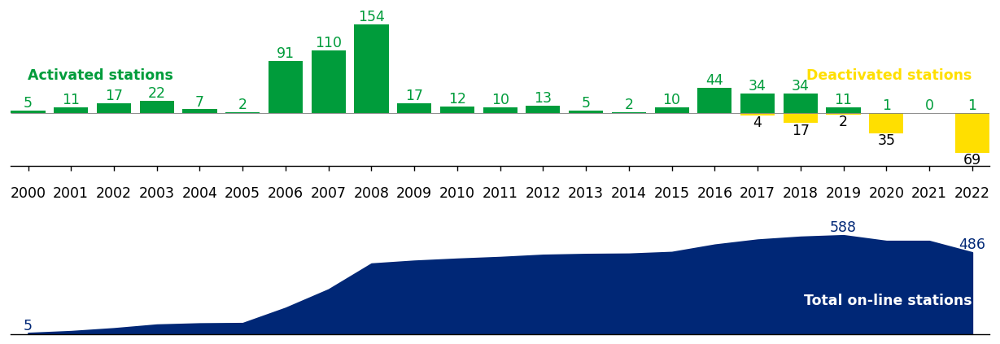

In [5]:
plot_stations_start()

# 2. Data Flow and Applied Methodology

On a big picture, we will collect, clean, transform, and analyze weather data. However, to accomplish our goal (point our cities with a similar climate change pattern), we will need to take many steps. More than this, we will iteratively move on our data. Some decisions will be revised considering our findings and insights.

Our following section and path are:

3. Data collection and (first) agregation

4. Data selection (stations selection)

     4.1 Station uptime
     
     4.2 Station data integrity
     
5. Data quality and outliers check

6. Data integrity and imputation

7. Discussion

8. Final notes

As said before, the clustering will be done on next work. Let's start (or continue) our journey!

# 3. Data collection and (first) agregation

As said before, the data use on this notebook was provide by INMET. I coded [one first notebook](https://www.kaggle.com/code/gregoryoliveira/brazil-weather-change-part-i-data-collection) that is scheduled to run every week to update the information. The whole [dataset](https://www.kaggle.com/datasets/gregoryoliveira/brazil-weather-information-by-inmet) is available here at Kaggle.

# 4. Data selection (stations selection)

We need to analyze our weather information with common time windows for more reliable results. Our first criterion to select stations will be the uptime of each one. However, more than uptime, we need to analyze the data integrity for each station. So, let's dig into the station data!

## 4.1 Station uptime criteria

In [6]:
stations = load_stations(clean=True)

In [7]:
def plot_stations(df_stations: pd.DataFrame,
                  plot_title: str,
                  plot_subtitle: str,
                  states: list() = []):
    """This function will create a plot consideting
    the start date of each station.
    """

    color = ['#909090' if state not in states else '#002776' for state in stations['state']]  # noqa

    f, ax = plt.subplots(figsize=(12, 4.25))

    plt.hlines(
        df_stations['state_station'],
        df_stations['record_first'],
        df_stations['record_last'],
        colors=color,
        linewidths=5)

    plt.axvspan(
        df_stations['record_first'].max(),
        df_stations['record_last'].min(),
        alpha=0.1,
        color='#002776')

    ax.spines[:].set_visible(False)
    ax.yaxis.set_ticks_position('right')
    ax.margins(x=0.01, y=0.05)
    ax.grid(axis='x', linestyle='--', alpha=0.4, visible=True)

    plt.tick_params(
        axis='x',
        which='both',
        bottom=False,
        top=False)

    plt.tick_params(
        axis='y',
        which='both',
        bottom=False,
        top=False)

    [t.set_color(color[i]) for i, t in enumerate(ax.yaxis.get_ticklabels())]

    display(HTML(f'<h3><strong>{plot_title}</strong></h3>'))
    display(HTML(f'{plot_subtitle}<br>'))

    return plt.show()

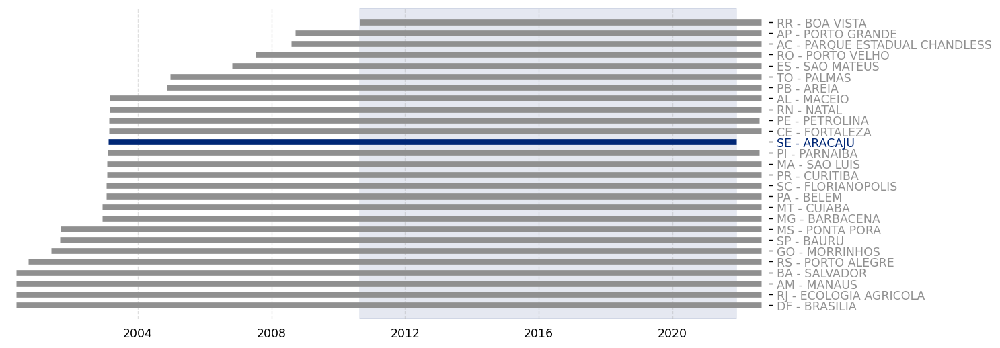

In [8]:
subtitle = 'We will cover the perior between ' \
    f'{stations.record_first.max():%Y-%m-%d} and ' \
    f'{stations.record_last.min():%Y-%m-%d}.<br>' \
    'We will need to analyze the other ' \
    '<span style="color:#002776"><strong>SE</span></strong> stations ' \
    'because <span style="color:#002776"><strong>ARACAJU</span></strong> ' \
    'station is limiting our analysis. But before, ' \
    'lets see the data integrity for each station.'

plot_stations(df_stations=stations,
              states=['SE'],
              plot_title='What are our analysis time span?',
              plot_subtitle=subtitle)

# 4.2 Station data integrity criteria

In [9]:
# Importing weather information
def load_weather(df_stations: pd.DataFrame, time_period: bool = True):
    """This function will load weather data and
    filter by stations and date period. Beyond that,
    the function will transform some implicity NaN
    into explicity.
    """
    # Loading
    df = pd.read_csv(
        '../input/brazil-weather-information-by-inmet/weather_sum_all/weather_sum_all.csv',  # noqa
        parse_dates=['DATA (YYYY-MM-DD)'])

    # Renaming columns
    df.columns.values[0] = 'id_station'
    df.columns.values[1] = 'date'

    # Filtering by stations
    df = df.loc[df['id_station'].isin(df_stations['id_station'])]

    # Filtering by date period
    if time_period:
        date_start = df_stations['record_first'].max()
        date_end = df_stations['record_last'].min()
        df = df.loc[(df['date'] >= date_start) & (df['date'] <= date_end)]
    else:
        date_start = df['date'].min()
        date_end = df['date'].max()

    # Transforming NaN
    data_range = pd.date_range(start=date_start, end=date_end)

    index = pd.MultiIndex.from_product(
        [df['id_station'].unique(), data_range],
        names=['id_station', 'date'])

    df = df.set_index(['id_station', 'date']).reindex(index).reset_index()

    df[df.columns[2:]] = df[df.columns[2:]].astype('float16')

    return df

In [10]:
weather = load_weather(df_stations=stations, time_period=True)

In [11]:
def qual_weather_data(
        df_weather: pd.DataFrame,
        df_stations: pd.DataFrame) -> pd.DataFrame:
    """This function will analyze how many measuares
    are missing per month by station. This will be use
    to plot the data integrity.
    """

    df = df_weather.copy()
    df = df.set_index(['id_station', 'date'])

    # Thanks https://stackoverflow.com/questions/15799162/resampling-within-a-pandas-multiindex  # noqa
    df = df.groupby(
        ['id_station'] + [pd.Grouper(freq='1MS', level=-1)]
    ).mean().reset_index()

    _ = df.iloc[:, 2:].isna().sum(axis=1)

    df.drop(columns=df.columns[2:], inplace=True)

    df['has_nan'] = _

    df['month_agg'] = df.groupby('id_station').cumcount().add(1)

    df = df.merge(df_stations[['id_station', 'state', 'state_station']])

    return df

In [12]:
weather_qual = qual_weather_data(df_weather=weather, df_stations=stations)

In [13]:
def plot_weather_qual(
        df_weather_qual: pd.DataFrame,
        plot_title: str,
        plot_subtitle: str,
        plot_txt_legend: bool,
        state: str = None) -> None:
    """This function will present a plot generate by matplotplot
    with title, subtitle, and annotations created by HTML.
    """

    df = df_weather_qual.copy()

    # If state is select, the df is filter and plot size is choose
    if state is not None:
        df = df_weather_qual[df_weather_qual['state'] == state].copy()
        plot_size = 2
    else:
        plot_size = 5

    f, ax = plt.subplots(figsize=(12, plot_size))

    qual_colors = ['#BEBEBE'] + [br_y] * 3 + [br_g] * 3 + [br_b] * 3

    sns.scatterplot(
        data=df,
        x='date',
        y='state_station',
        hue='has_nan',
        hue_order=[i for i in range(10)],
        size='has_nan',
        palette=qual_colors,
        legend=False)

    ax.margins(x=0.01)
    ax.grid(axis='x', linestyle='--', alpha=0.4, visible=True)
    ax.spines[:].set_visible(False)
    ax.set_ylabel('State and City')
    ax.set_xlabel('Years')

    plt.tick_params(
        axis='x',
        which='both',
        bottom=False,
        top=False)

    plt.tick_params(
        axis='y',
        which='both',
        bottom=False,
        top=False)

    display(HTML(f'<h3><strong>{plot_title}</strong></h3>'))
    display(HTML(f'{plot_subtitle}<br>'))

    if plot_txt_legend:
        display(HTML('Stations may present <span style="color:#808080"><strong>none</span></strong>, ' \
                     '<span style="color:#ffdf00"><strong>few</span></strong>, ' \
                     '<span style="color:#009c3b"><strong>some</span></strong>, ' \
                     'or <span style="color:#002776"><strong>many</span></strong> ' \
                     'missing information by month.<br>'))
    
    plt.show()

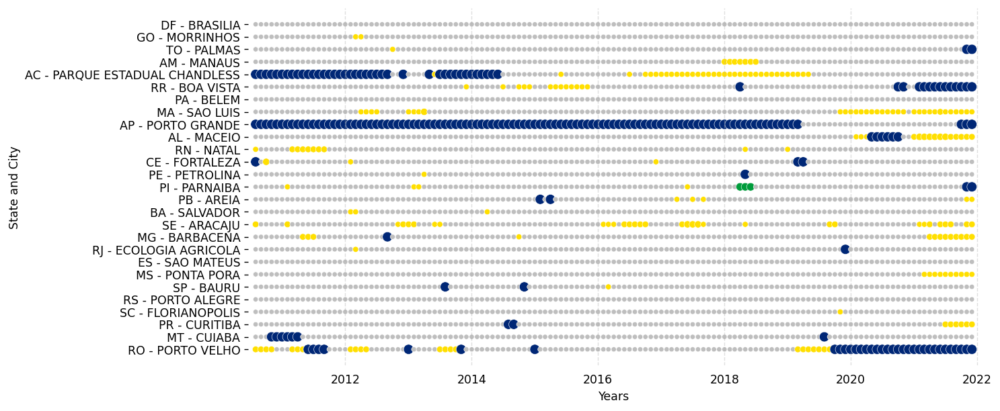

In [14]:
subtitle = 'Most stations have high data integrity. ' \
           'Otherwise, we need to analyse better stations from ' \
           '<strong>AC</strong>, <strong>AP</strong>, and <strong>RO</strong>.'

plot_weather_qual(
    df_weather_qual=weather_qual,
    plot_title='Data integrity: How many measures are missing in each month?',
    plot_subtitle=subtitle,
    plot_txt_legend=True,
    state=None)

Let's see if we have better options to AC, AP, SE, and RO states.

In [15]:
def load_stations_states(states: list()) -> pd.DataFrame:
    """This function load the stations based on a
    state list. The cleaning/selecting stations is
    ignored."""

    df = load_stations(clean=False)

    df = df[df['state'].isin(states)]

    return df

In [16]:
stations_temp = load_stations_states(states=['AC', 'AP', 'SE', 'RO'])

In [17]:
weather_temp = load_weather(df_stations=stations_temp, time_period=False)

In [18]:
weather_qual = qual_weather_data(
    df_weather=weather_temp,
    df_stations=stations_temp)

weather_qual = weather_qual.merge(
    stations_temp[['id_station', 'record_first', 'record_last']])

weather_qual = weather_qual[
    (weather_qual['date'] >= weather_qual['record_first']) &
    (weather_qual['date'] <= weather_qual['record_last'])]

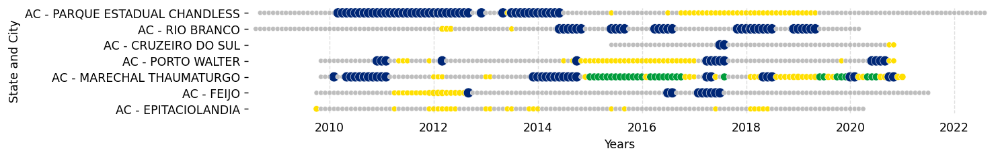

In [19]:
subtitle = 'All stations present one or more problems, but the whole ' \
           'stations will limit our time span. On this way, the better choice ' \
           'is remove the whole state from our analysis.'

plot_weather_qual(
    df_weather_qual=weather_qual,
    plot_title='Data integrity: is there a better choice than the Parque Estadual Chandless station?',
    plot_subtitle=subtitle,
    plot_txt_legend=True,
    state='AC')

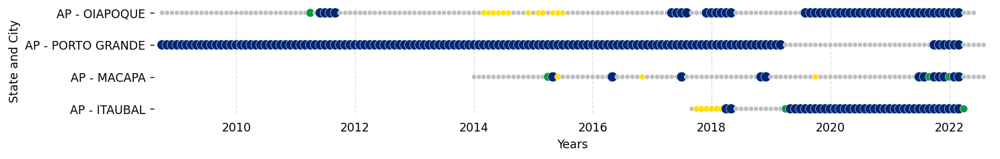

In [20]:
subtitle = 'Oiapoque station shows more valid data, so it is the better choice for us.'

plot_weather_qual(
    df_weather_qual=weather_qual,
    plot_title='Data integrity: is there a better choice than the Porto Grande station?',
    plot_subtitle=subtitle,
    plot_txt_legend=True,
    state='AP')

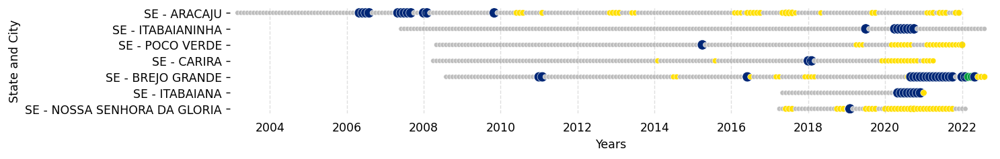

In [21]:
subtitle = 'Itabaianinha will not limit our analysis despite it missing data. It seems to be a better choice.'

plot_weather_qual(
    df_weather_qual=weather_qual,
    plot_title='Data integrity: is there a better choice than the Aracaju station?',
    plot_subtitle=subtitle,
    plot_txt_legend=True,
    state='SE')

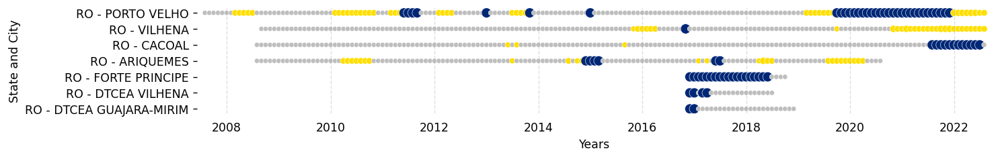

In [22]:
subtitle = 'Vilhena station is better because it is the second older station, stills running, and has more valid data.'

plot_weather_qual(
    df_weather_qual=weather_qual,
    plot_title='Data integrity: is there a better choice than the Porto Velho station?',
    plot_subtitle=subtitle,
    plot_txt_legend=True,
    state='RO')

In [23]:
stations_select = ['A242', 'A417', 'A938']

stations_deselect = ['A102', 'A244', 'A409', 'A925']

stations_temp = stations_temp[stations_temp['id_station'].isin(stations_select)]

stations = stations[~stations['id_station'].isin(stations_deselect)]

stations = pd.concat([stations, stations_temp]).reset_index(drop=True)

stations.sort_values('record_first', inplace=True)

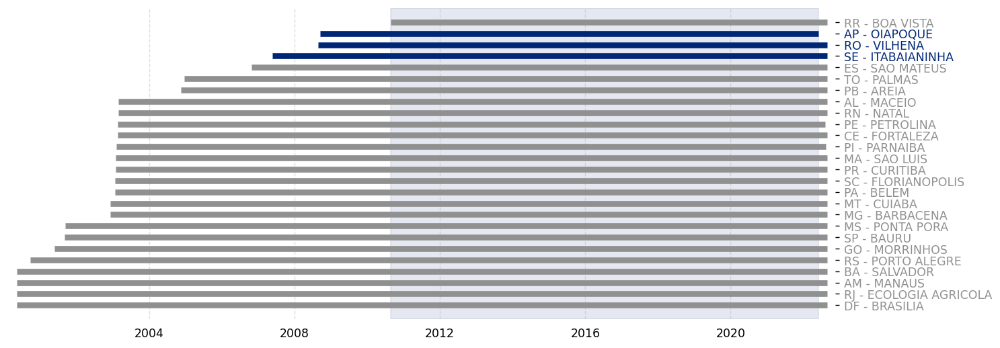

In [24]:
subtitle = 'We will now cover the period between ' \
          f'{stations.record_first.max():%Y-%m-%d} and ' \
          f'{stations.record_last.min():%Y-%m-%d}.<br>' \
          'Our windows is a little wider and we selected better ' \
          'stations based on the data integrity.'

plot_stations(df_stations=stations,
              states=['AC', 'AP', 'SE', 'RO'],
              plot_title='Have our analysis time span changed?',
              plot_subtitle=subtitle)

# 5. Data quality and outliers check

In [25]:
weather_qual = qual_weather_data(df_weather=weather, df_stations=stations)

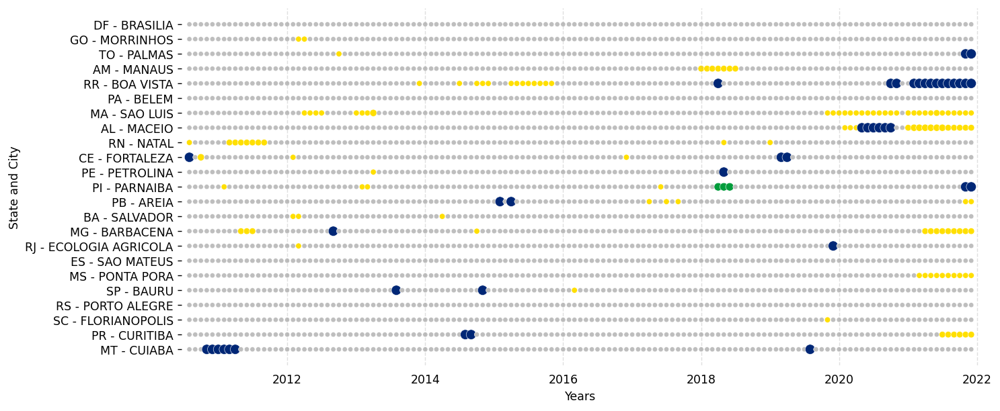

In [26]:
subtitle = 'We have more data available now. Lets dig deeper on other data quality aspect.'

plot_weather_qual(
    df_weather_qual=weather_qual,
    plot_title='Data integrity: what come next?',
    plot_subtitle=subtitle,
    plot_txt_legend=True,
    state=None)

In [27]:
weather = load_weather(df_stations=stations, time_period=False)

weather = weather.merge(stations[['region', 'state', 'id_station', 'record_first', 'record_last']])

weather = weather[
    (weather['date'] >= weather['record_first']) &
    (weather['date'] <= weather['record_last'])]

weather.drop(columns=['record_first', 'record_last'], inplace=True)

From this point, we will drop the city on the station description. We understand that considering the sizes of the Brazilian states, one city cannot represent the whole state’s climate, but for our purpose, we will accept this premise. So, let's look at general statistics.

In [28]:
cols_name_y = {
    'rain_max':  'Hour Rain (mm)',
    'rad_max':  'Radiation (W/m2)',
    'temp_avg':  'Temp (oC)',
    'temp_max':  'Temp (oC)',
    'temp_min':  'Temp (oC)',
    'hum_max':  'Humidit (%)',
    'hum_min':  'Humidit (%)',
    'wind_max':  'Wind (m/s)',
    'wind_avg':  'Wind (m/s)',
}

cols_name = {
    'rain_max':  'Maximum Hour Rain',
    'rad_max':  'Maximum Radiation',
    'temp_avg':  'Average Temperature',
    'temp_max':  'Maximum Temperature',
    'temp_min':  'Minimum Temperature',
    'hum_max':  'Maximum Humidit',
    'hum_min':  'Minimum Humidit',
    'wind_max':  'Maximum Wind Speed',
    'wind_avg':  'Average Wind Speed',
}

cols_unit = {
    'rain_max':  'mm',
    'rad_max':  'W/m2',
    'temp_avg':  'oC',
    'temp_max':  'oC',
    'temp_min':  'oC',
    'hum_max':  '%',
    'hum_min':  '%',
    'wind_max':  'm/s',
    'wind_avg':  'm/s',
}

cols_name_unit = {item: cols_name[item] + ' (' + cols_unit[item] + ')' for item in cols_name}

In [29]:
display(HTML('<h3><strong>General statistics</strong></h3>'))
display(HTML('Radiation and Wind (maximum and average) should be diferent then 0. '\
             'Lets indicate with NaN rows where this variable is less then 0.1.<br>'))

weather.iloc[:, 2:-2].dropna().describe().iloc[3:].round(2).rename(columns=cols_name_unit)  # Add style on dataframe

,Maximum Hour Rain (mm),Maximum Radiation (W/m2),Average Temperature (oC),Maximum Temperature (oC),Minimum Temperature (oC),Maximum Humidit (%),Minimum Humidit (%),Maximum Wind Speed (m/s),Average Wind Speed (m/s)
min,0.00,0.0,4.92,6.00,-5.00,18.0,0.0,0.00,0.00
25%,0.00,2346.0,21.94,27.30,18.00,86.0,40.0,7.40,1.34
50%,0.00,2860.0,25.05,30.30,21.30,92.0,52.0,8.90,1.95
75%,1.40,3350.0,26.98,32.41,23.41,95.0,61.0,10.60,2.80
max,97.62,50080.0,44.88,45.00,44.69,100.0,100.0,99.69,8.80


In [30]:
weather.loc[weather['rad_max'] < 0.1, 'rad_max'] = np.NaN
weather.loc[weather['wind_max'] < 0.1, 'wind_max'] = np.NaN
weather.loc[weather['wind_avg'] < 0.1, 'wind_avg'] = np.NaN

In [31]:
display(HTML('<h3><strong>General statistics after cleaning</strong></h3>'))
display(HTML('Radiation and Wind Maximum present some extreme values, '\
             'lets inspect all variables first. Then, we will select some '\
             'of them to dig deeper.<br>'))

weather.iloc[:, 2:-2].dropna().describe().iloc[3:].round(2).rename(columns=cols_name_unit)

,Maximum Hour Rain (mm),Maximum Radiation (W/m2),Average Temperature (oC),Maximum Temperature (oC),Minimum Temperature (oC),Maximum Humidit (%),Minimum Humidit (%),Maximum Wind Speed (m/s),Average Wind Speed (m/s)
min,0.00,0.1,4.92,6.00,-5.00,18.0,0.0,0.40,0.10
25%,0.00,2348.0,22.02,27.41,18.09,86.0,40.0,7.40,1.37
50%,0.00,2864.0,25.09,30.30,21.41,92.0,52.0,9.00,1.97
75%,1.40,3354.0,27.00,32.41,23.50,95.0,61.0,10.70,2.82
max,97.62,50080.0,44.88,45.00,44.69,100.0,100.0,99.69,8.80


In [32]:
def df_weather_melt(df_weather: pd.DataFrame) -> pd.DataFrame:
    df = df_weather.melt(
        id_vars=['region', 'state', 'id_station', 'date'],
        var_name='var',
        value_name='value')
    return df

In [33]:
weather_melt = df_weather_melt(df_weather=weather)

In [34]:
# Outliers
weather_out = weather_melt.dropna(). \
    sort_values(['region', 'state', 'var', 'date'])

In [35]:
def plot_box_weather(
        df_weather_out: pd.DataFrame,
        var: str = 'rain_max',
        plot_title: str = None,
        plot_subtitle: str = None,
        drop_zero: bool = False) -> None:
    """This function will create a boxplot to
    a weather variable select"""

    df = df_weather_out[df_weather_out['var'] == var].copy()

    if drop_zero:
        df = df[df['value'] != 0]

    f, ax = plt.subplots(figsize=(12, 4))

    sns.boxplot(x='state',
                y='value',
                data=df,
                ax=ax)

    ax.margins(0)
    ax.spines[:].set_visible(False)

    ax.grid(axis='x', linestyle='--', alpha=0.2, visible=True)
    ax.grid(axis='y', linestyle='--', alpha=0.2, visible=True)

    ax.set_xlabel('States')
    ax.set_ylabel(cols_name_unit[var])

    ax.set_ylim(bottom=0)

    plt.tick_params(
        axis='x',
        which='both',
        bottom=False,
        top=False)

    plt.tick_params(
        axis='y',
        which='both',
        bottom=False,
        top=False)

    if plot_title is None:
        plot_title = f'Quality check @ {cols_name_unit[var]}'

    if plot_subtitle is None:
        plot_subtitle = 'Considering the many points outside the IQR, ' \
                        'we will dig deeper on this variable on next section.'

    display(HTML(f'<h4><strong>{plot_title}</strong></h4>'))
    display(HTML(f'{plot_subtitle}<br>'))

    plt.show()

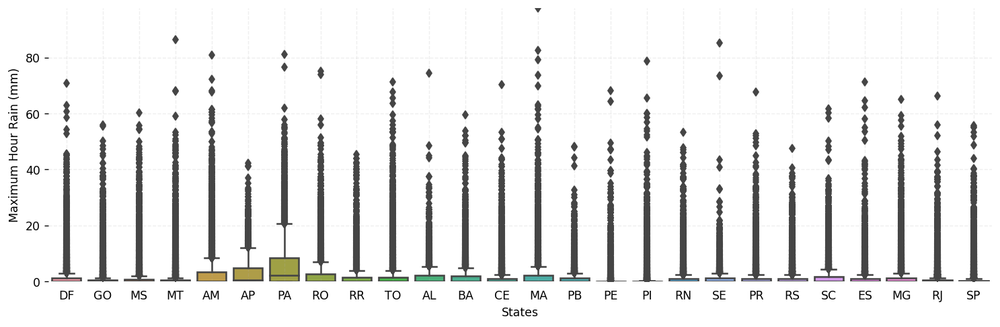

In [36]:
plot_box_weather(
        df_weather_out=weather_out,
        var='rain_max',
        plot_title=None,
        plot_subtitle=None)

Considering that does not raine every day, let's remove zero values and see our boxplot again.

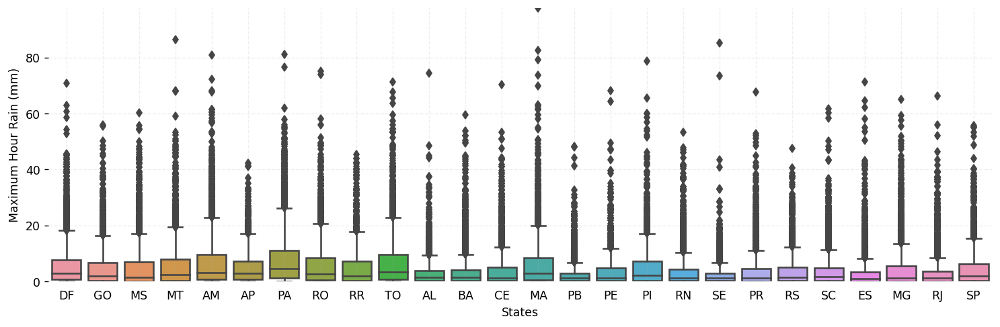

In [37]:
plot_subtitle='After dropping zeros, our boxplots show better information. '\
              'However, considering Brazilian weather, it will be very hard '\
              'to point out if the data is unreal. Besides this, we need to remember that ' \
              'this variable was summarized. In other words, if we analyze data hourly, ' \
              'as in the original form, we may see fewer outlier points. ' \
              'Therefore, we will all points in our analysis.'

plot_box_weather(
        df_weather_out=weather_out,
        var='rain_max',
        plot_title=None,
        plot_subtitle=plot_subtitle,
        drop_zero=True)

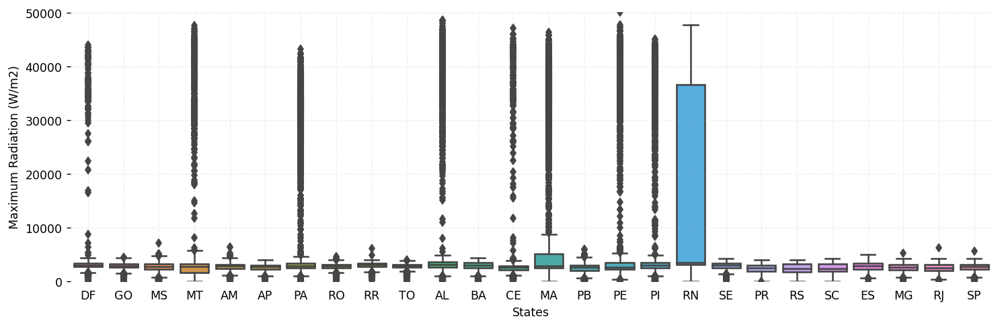

In [38]:
plot_box_weather(
        df_weather_out=weather_out,
        var='rad_max',
        plot_title=None,
        plot_subtitle='Things got a little wierd here. On next section, '\
                      'we will try to understand DF, MT, PA, AL, CE, MA, PE, PI, and RN behavior.')

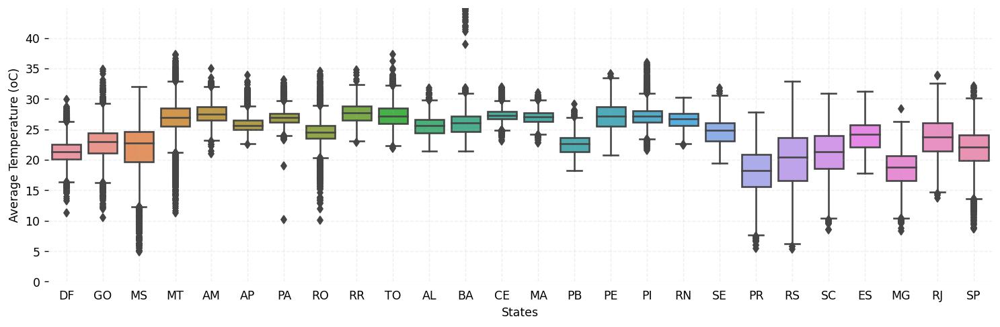

In [39]:
plot_subtitle='Besides the last measure, Average Temperature does '\
              'not get our attetion for any point. '\
              'We see some outliers, but far distance from radiation behavior.' \
              'all poins in our analysis.'

plot_box_weather(
        df_weather_out=weather_out,
        var='temp_avg',
        plot_title=None,
        plot_subtitle=plot_subtitle)

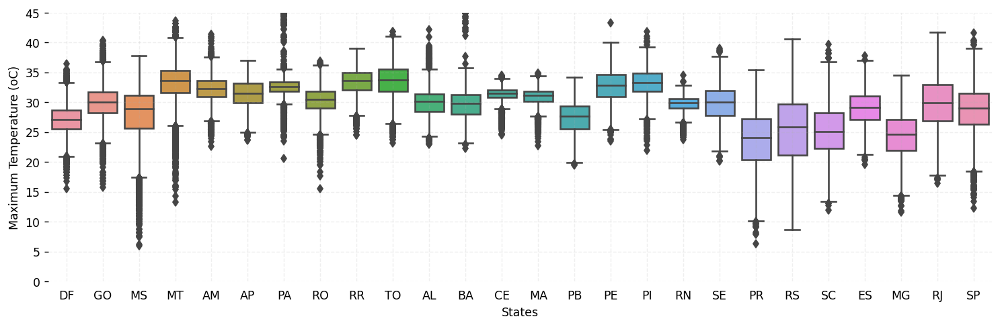

In [40]:
plot_box_weather(
        df_weather_out=weather_out,
        var='temp_max',
        plot_title=None,
        plot_subtitle='Maximum Temperature shows the same behavior than Average Temperature.')

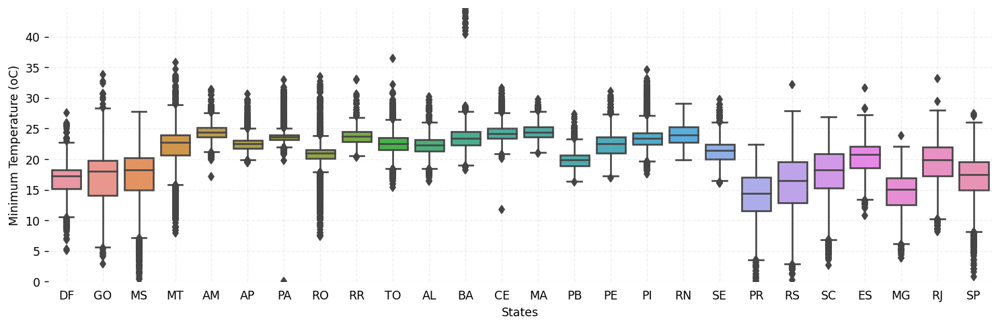

In [41]:
plot_box_weather(
        df_weather_out=weather_out,
        var='temp_min',
        plot_title=None,
        plot_subtitle='And again, same behavior than Average Temperature.')

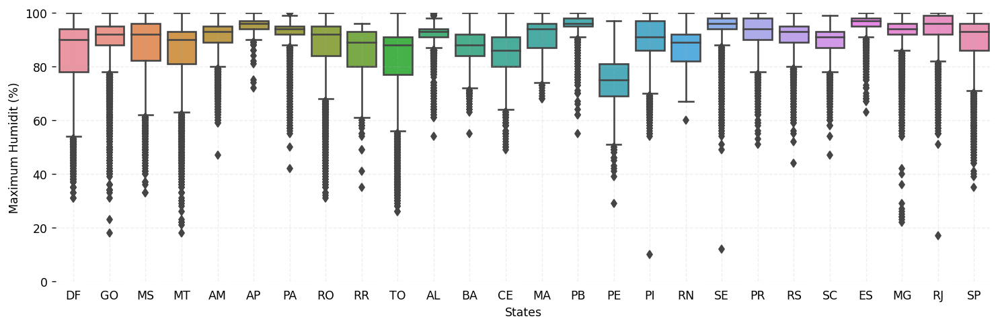

In [42]:
plot_box_weather(
        df_weather_out=weather_out,
        var='hum_max',
        plot_title=None,
        plot_subtitle='Besides some low points, there are nothing to say about Maximum Humity.')

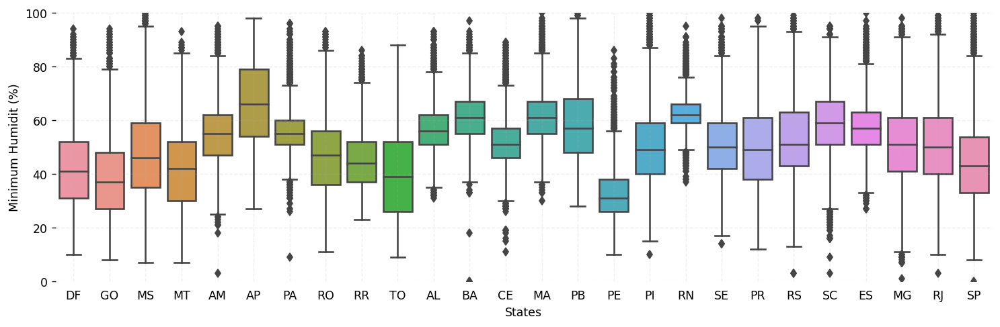

In [43]:
plot_box_weather(
        df_weather_out=weather_out,
        var='hum_min',
        plot_title=None,
        plot_subtitle='Besides the spread of points, there are nothing to say about Minimum Humity too.')

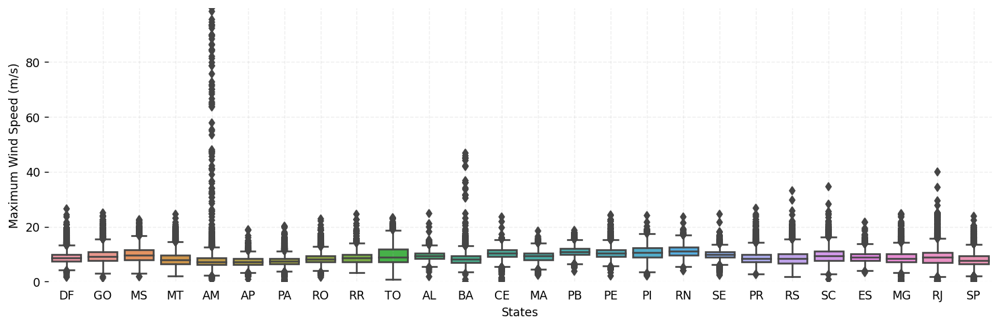

In [44]:
plot_box_weather(
        df_weather_out=weather_out,
        var='wind_max',
        plot_title=None,
        plot_subtitle='Maximum Wind at AM, BA and RJ preset many outliers. Lets take of look on them next section.')

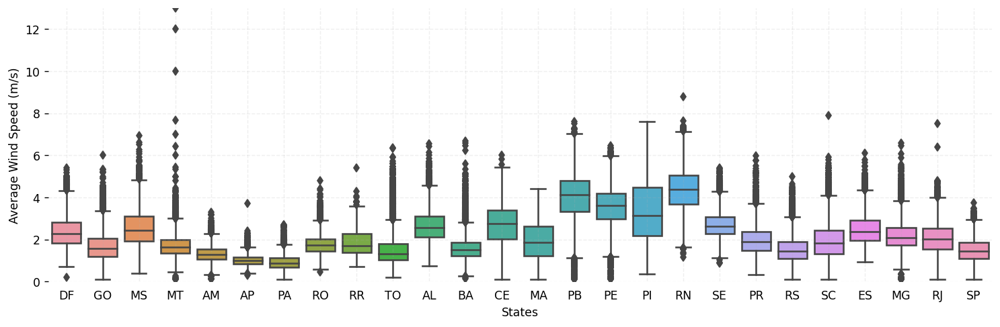

In [45]:
plot_box_weather(
        df_weather_out=weather_out,
        var='wind_avg',
        plot_title=None,
        plot_subtitle='Besides the value of Average Wind Speed at MT, there is nothing to say about this measure.')

To dig deeper into the variables as we said before, we will create a function that takes the variable, the state, the value of interest, and the window period to create a plot. Beyond that, this same function will be able to apply multiplication by a chosen ratio. With this, we will be able to test some transformations to improve our data quality. However, to avoid some tedious reading, we will hide some outputs.

In [46]:
# Plotting variable by interest windows
def plot_select_weather(
        df_weather_melt: pd.DataFrame,
        state: str,
        var: str,
        mode: str,
        value_ref: int,
        days: int = 90,
        indice: str = None,
        ratio: int = 1) -> None:
    """This function will slice a df_weather_melt dataframe
    and plot one row for each period of interest. Rows can
    be identified by one column or considering a reference
    value.
    """
    # Slicing data
    df = df_weather_melt[(df_weather_melt['state'] == state) &
                         (df_weather_melt['var'] == var)].copy()

    df['missing'] = df['value'].isna()
    df['value'].fillna(0, inplace=True)

    # Selecting rows
    if mode == 'smaller':
        df['select'] = df.loc[:, 'value'] < value_ref
        str_title = f'Values {mode} than {str(value_ref) + cols_unit[var]} with periods of {str(days)} days'  # noqa

    elif mode == 'equal':
        df['select'] = df.loc[:, 'value'] == value_ref
        str_title = f'Values {mode} than {str(value_ref) + cols_unit[var]} with periods of {str(days)} days'  # noqa

    elif mode == 'greater':
        df['select'] = df.loc[:, 'value'] > value_ref
        str_title = f'Values {mode} than {str(value_ref) + cols_unit[var]} with periods of {str(days)} days'  # noqa

    else:
        df['select'] = df.loc[:, mode]
        str_title = f'Values selected at column {mode} with periods of {str(days)} days'  # noqa

    # Finding dates with interest
    lt_dates = df.loc[df['select'], 'date'].to_list()
    lt_days_after = [pd.DataFrame({'when': pd.date_range(start=day, periods=days, freq='D')}) for day in lt_dates]   # noqa
    lt_days_before = [pd.DataFrame({'when': pd.date_range(end=day, periods=days, freq='D')}) for day in lt_dates]   # noqa

    df_mask = pd.concat([pd.concat(lt_days_after), pd.concat(lt_days_before)]). \
                        sort_values('when').drop_duplicates(ignore_index=True)

    df['grouped'] = df['date'].isin(df_mask['when'])

    df['slice'] = (~df['grouped']).cumsum()

    groups = df.loc[df['grouped'], 'slice'].unique()

    groups_dict = {y: x for x, y in enumerate(groups)}

    df = df.loc[df['grouped']]

    df['slice'].replace(groups_dict, inplace=True)

    df.loc[df['select'], 'value'] = df.loc[df['select'], 'value'] / ratio

    # Plotting
    rows = len(groups_dict)

    f, ax = plt.subplots(
        nrows=rows,
        figsize=(12, 1.5*rows),
        sharex=False,
        sharey=False)

    # Creating a function to protect for only one row
    def subplot_df(ax_, x):
        sns.scatterplot(
            x="date",
            y='value',
            ci=None,
            color=br_b,
            data=df[(df['slice'] == x) & (df['select'])],
            zorder=5,
            alpha=0.8,
            s=15,
            ax=ax_)

        sns.scatterplot(
            x="date",
            y='value',
            ci=None,
            color=br_y,
            data=df[(df['slice'] == x) & (df['missing'])],
            zorder=5,
            s=15,
            ax=ax_)

        sns.lineplot(
            x="date",
            y='value',
            ci=None,
            color=br_g,
            data=df[df['slice'] == x],
            ax=ax_)

        ax_.margins(0, 0.1)
        
        ylim = min(df['value'].min(), 0)
        
        ax_.set_ylim(bottom=ylim)
        ax_.spines[['right', 'left', 'top']].set_visible(False)
        ax_.set_xlabel('')
        ax_.set_ylabel(cols_name_y[var])
        ax_.grid(axis='y', linestyle='--', alpha=0.3, visible=True)

    # Filling the subplots
    if rows == 1:
        subplot_df(ax, 0)
    else:
        for x in range(rows):
            subplot_df(ax[x], x)

    str_ratio = (f'. Target values divided by {str(ratio)}') if ratio != 1 else ''

    str_missing = '. Missing values were fill with zero and yellow marker.' if df['missing'].sum() != 0 else '<br>'  # noqa
    
    if indice is None:
        title = f'<h3>{cols_name[var]} @ {state} </h3>'
    else:
        title = f'<h3>{indice} {cols_name[var]} @ {state} </h3>'
        
    display(HTML(title))
    display(HTML(str_title + str_ratio + str_missing + '<br>'))

    plt.show()

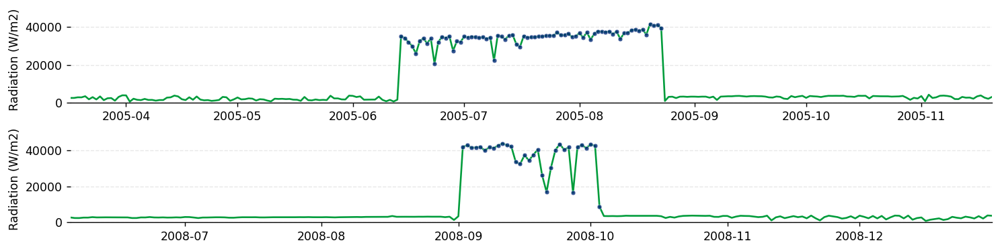

In [47]:
plot_select_weather(
    df_weather_melt=weather_melt,
    state='DF',
    var='rad_max',
    mode='greater',
    value_ref=8000,
    days=90,
    ratio=1)

The values above 8,000W/m2 seem 10 times greater than usual. Let's see this inverse transformation applied!

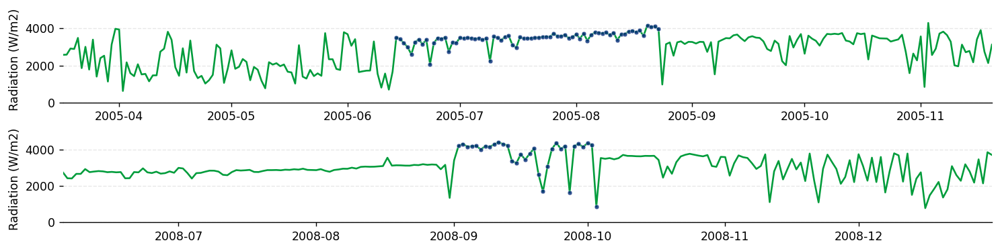

In [48]:
plot_select_weather(
    df_weather_melt=weather_melt,
    state='DF',
    var='rad_max',
    mode='greater',
    value_ref=8000,
    days=90,
    ratio=10)

To avoid some tedious reading, we will hide the following plots with the same data analysis strategy. However, at the end of this session, we will apply the transformations selected to our dataframe.

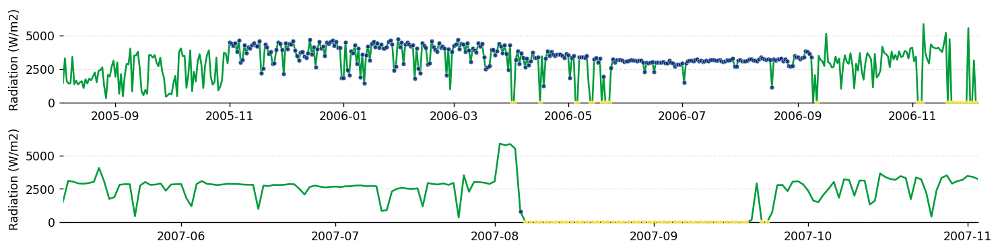

In [49]:
plot_select_weather(
    df_weather_melt=weather_melt,
    state='MT',
    var='rad_max',
    mode='greater',
    value_ref=8000,
    days=90,
    ratio=10)

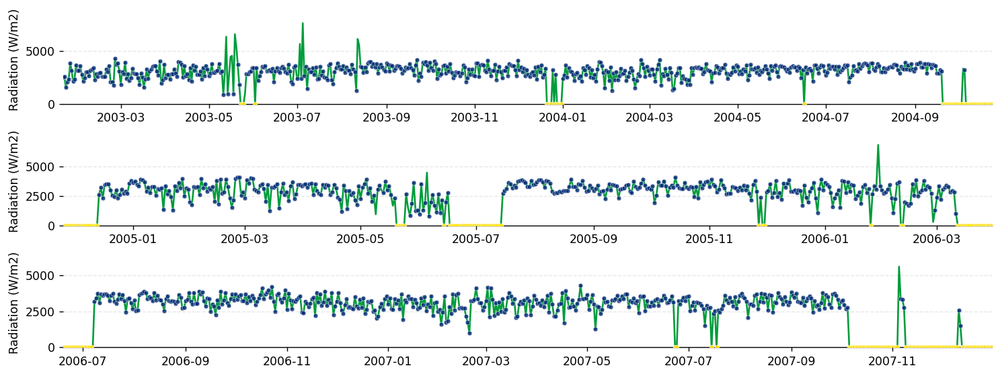

In [50]:
plot_select_weather(
    df_weather_melt=weather_melt,
    state='PA',
    var='rad_max',
    mode='greater',
    value_ref=8000,
    days=20,
    ratio=10)

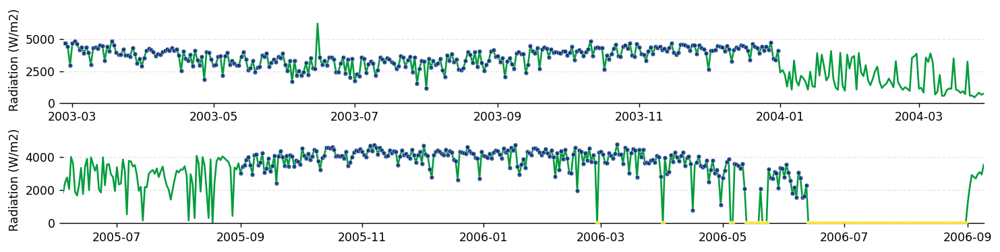

In [51]:
plot_select_weather(
    df_weather_melt=weather_melt,
    state='AL',
    var='rad_max',
    mode='greater',
    value_ref=8000,
    days=90,
    ratio=10)

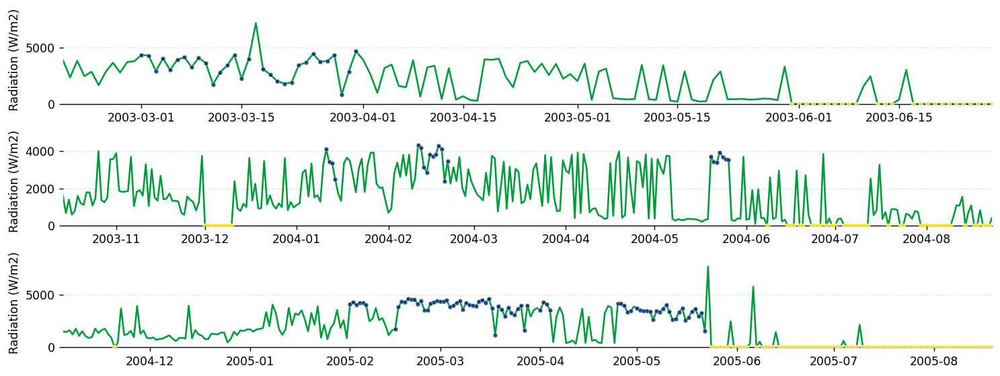

In [52]:
plot_select_weather(
    df_weather_melt=weather_melt,
    state='CE',
    var='rad_max',
    mode='greater',
    value_ref=8000,
    days=90,
    ratio=10)

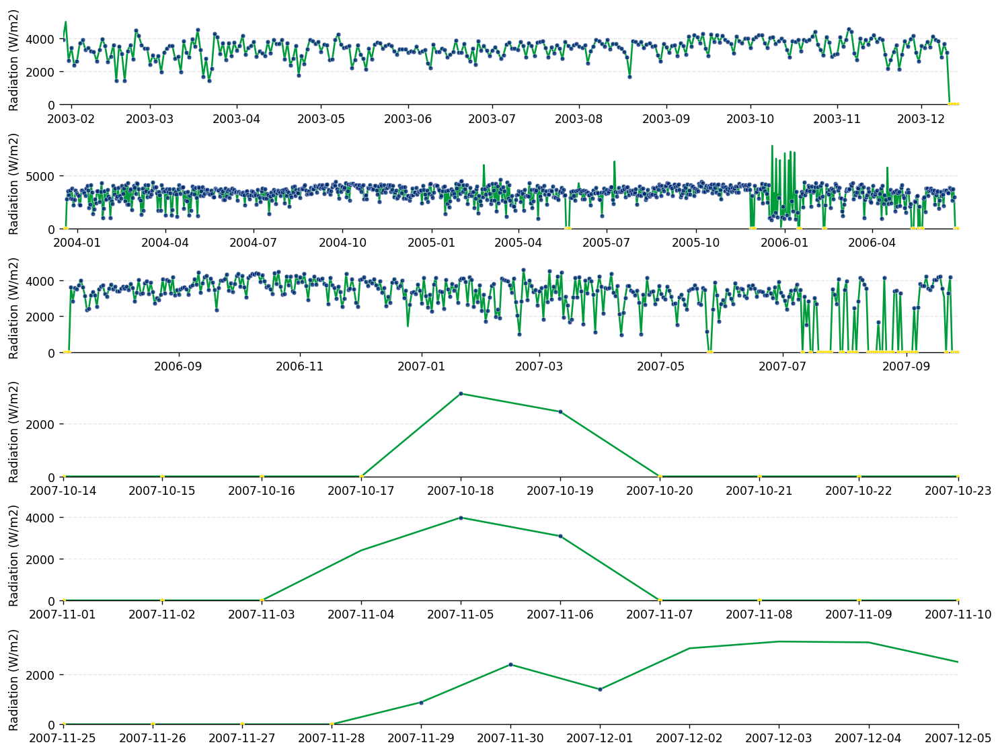

In [53]:
plot_select_weather(
    df_weather_melt=weather_melt,
    state='MA',
    var='rad_max',
    mode='greater',
    value_ref=8000,
    days=5,
    ratio=10)

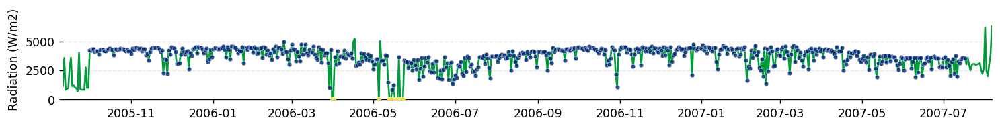

In [54]:
plot_select_weather(
    df_weather_melt=weather_melt,
    state='PE',
    var='rad_max',
    mode='greater',
    value_ref=8000,
    days=21,
    ratio=10)

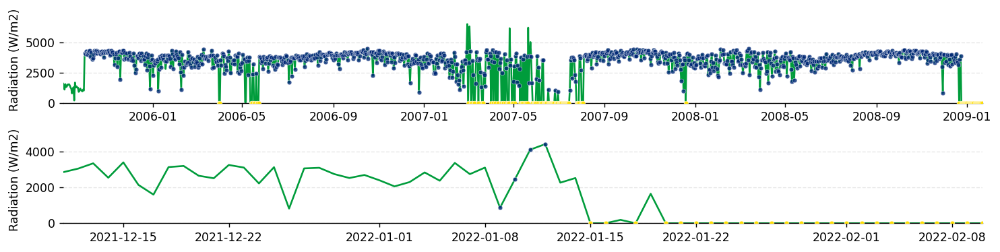

In [55]:
plot_select_weather(
    df_weather_melt=weather_melt,
    state='PI',
    var='rad_max',
    mode='greater',
    value_ref=8000,
    days=30,
    ratio=10)

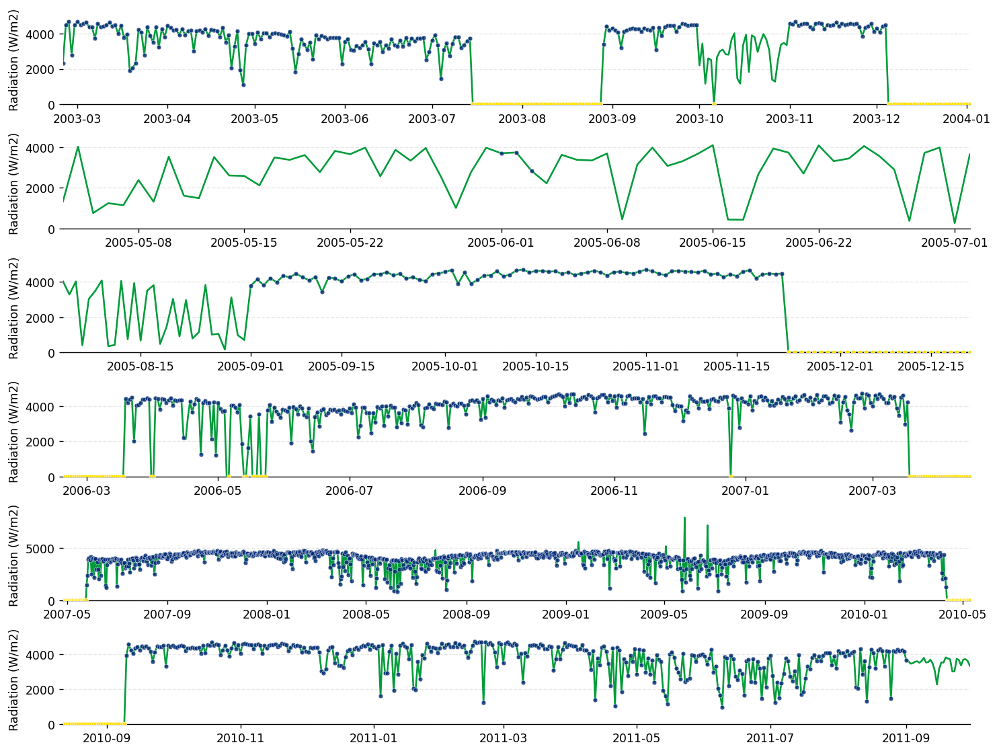

In [56]:
plot_select_weather(
    df_weather_melt=weather_melt,
    state='RN',
    var='rad_max',
    mode='greater',
    value_ref=8000,
    days=30,
    ratio=10)

It is time to se the wind variable!

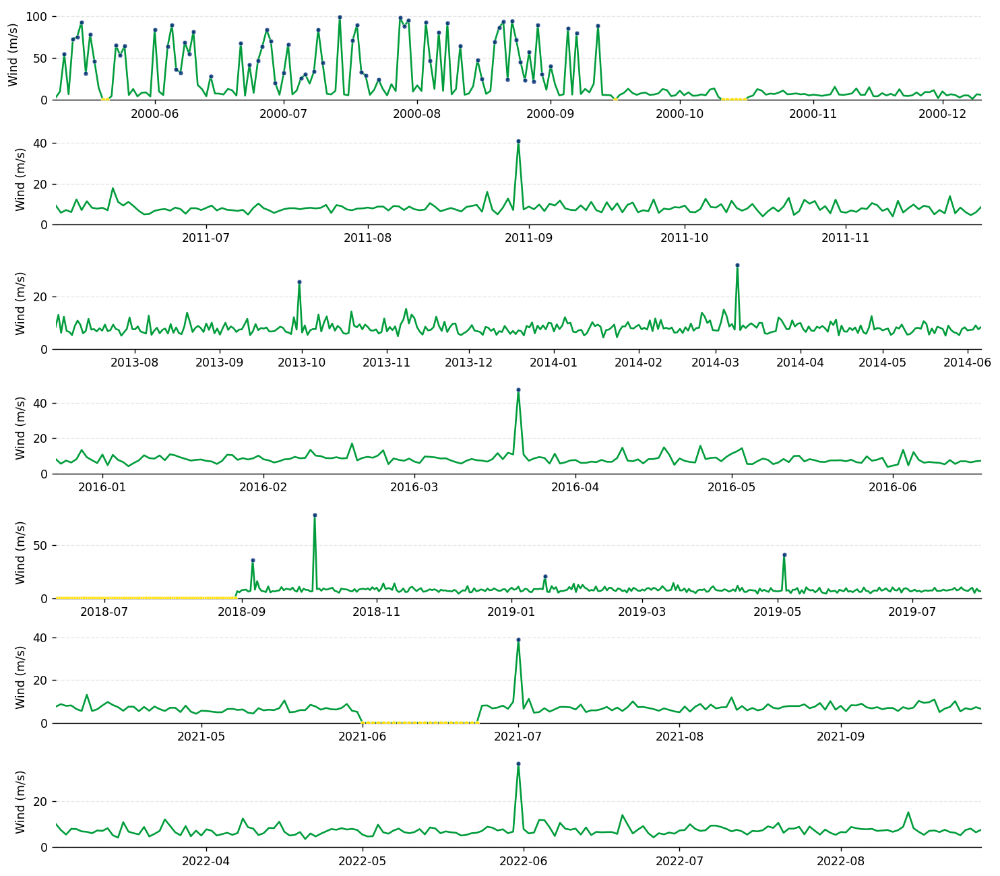

In [57]:
plot_select_weather(
    df_weather_melt=weather_melt,
    state='AM',
    var='wind_max',
    mode='greater',
    value_ref=20,
    days=90,
    ratio=1)

It seems that some points are 10 times greater here too!

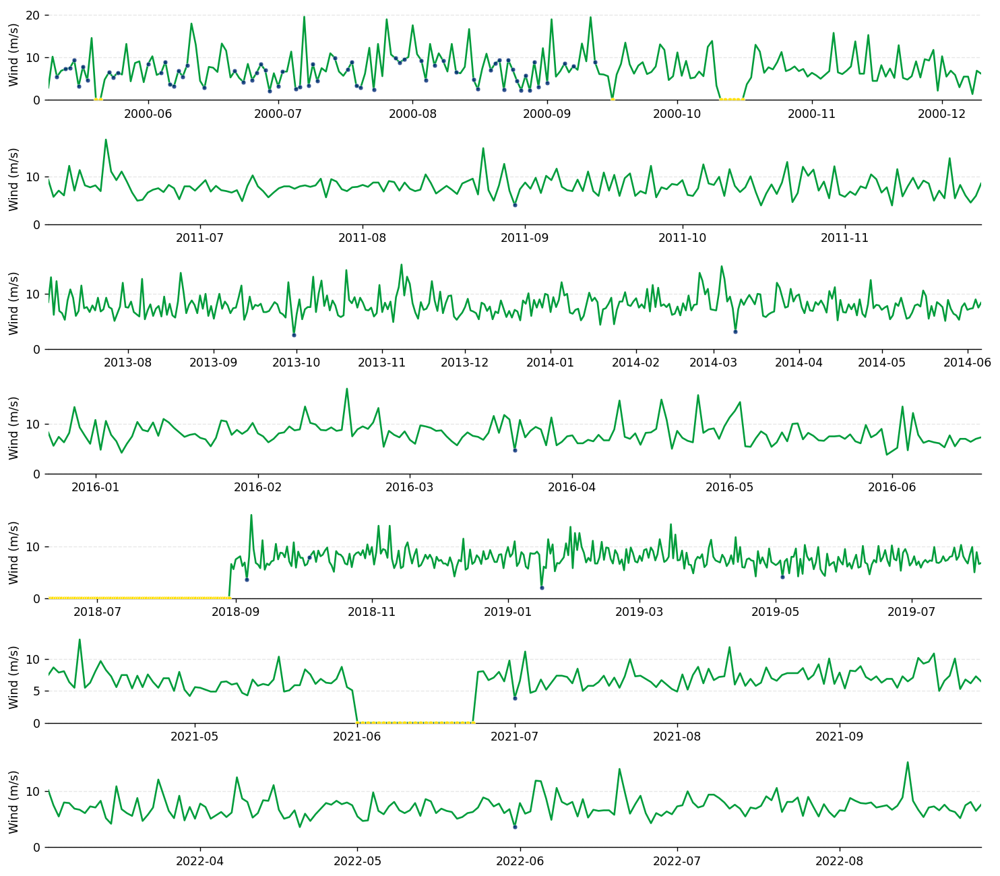

In [58]:
plot_select_weather(
    df_weather_melt=weather_melt,
    state='AM',
    var='wind_max',
    mode='greater',
    value_ref=20,
    days=90,
    ratio=10)

As said before, the following plot will be hide. You can click and see them.

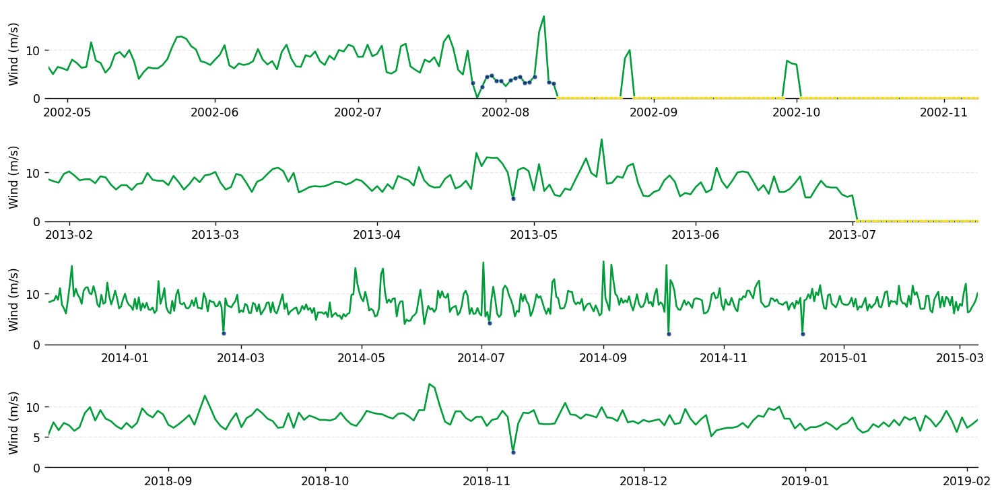

In [59]:
plot_select_weather(
    df_weather_melt=weather_melt,
    state='BA',
    var='wind_max',
    mode='greater',
    value_ref=20,
    days=90,
    ratio=10)

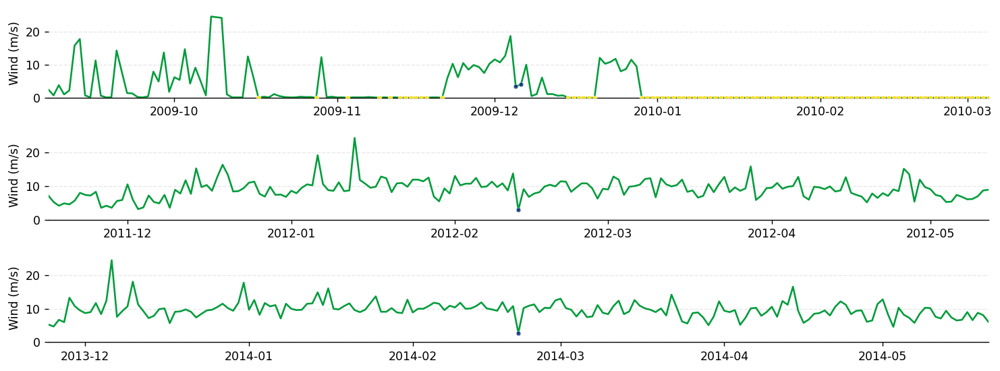

In [60]:
plot_select_weather(
    df_weather_melt=weather_melt,
    state='RJ',
    var='wind_max',
    mode='greater',
    value_ref=25,
    days=90,
    ratio=10)

If you show the last plot, wind speed at RJ, you saw that the transformation does not fit well. So, instead of dividing, we will drop these values. Let's apply the transformation as defined before.

In [61]:
def weather_trans(
        df_weather: pd.DataFrame,
        var: str, states: list(),
        limit: int, ratio:
        int = 10,
        set_na: bool = False) -> pd.DataFrame:
    """This function will transform outliers
    on weather dataframe considering some rules.
    """
    df = df_weather.copy()

    mask = (df[var] >= limit) & (df['state'].isin(states))

    if set_na:
        df.loc[mask, var] = df.loc[mask, var] / ratio
    else:
        df.loc[mask, var] = np.NaN

    return df

In [62]:
weather = weather_trans(
    df_weather=weather,
    var='rad_max',
    states=['DF', 'MT', 'PA', 'AL', 'CE', 'MA', 'PE', 'PI', 'RN'],
    limit=8000,
    ratio=10,
    set_na=False)

weather = weather_trans(
    df_weather=weather,
    var='wind_max',
    states=['AM', 'BA'],
    limit=20,
    ratio=10,
    set_na=False)

weather = weather_trans(
    df_weather=weather,
    var='wind_max',
    states=['RJ'],
    limit=25,
    ratio=10,
    set_na=True)

# 6. Data integrity and imputation

Let's begin our data integrity improve by seeing how much data is missing in each state by variable.

In [63]:
weather_melt = df_weather_melt(df_weather=weather)

In [64]:
data_integrity = pd.pivot_table(
    data=weather_melt,
    values='value',
    index='state',
    columns='var',
    aggfunc=lambda x: x.isna().mean()
)

data_integrity.columns.name = "Variables"

data_integrity.index.name = "States"

In [65]:
def make_pretty(styler):
    styler.format('{:.2%}')
    styler.highlight_between(left=0.2, props='text-align:center')
    styler.highlight_between(right=0.2, props='text-align:center;color:#A0A0A0')
    styler.apply(lambda x: ['font-weight:bold' if x.name in ["AP", "MS"] else '' for i in x], axis=1)
    return styler

display(HTML('<h3><strong>What states/variables show more than 20% of missing values?</strong></h3>'))
display(HTML('<p>AP and MS have more than 20% of missing data for each ' \
             'variable and we will drop them from our analysis considering this. <br>'\
             'Other states and variables have more too, however, '\
             'other variables are below, and we will impute them. </p>'))

data_integrity[(data_integrity > 0.20).any(axis=1)].rename(columns=cols_name_unit).style.pipe(make_pretty)

Variables,Maximum Humidit (%),Minimum Humidit (%),Maximum Radiation (W/m2),Maximum Hour Rain (mm),Average Temperature (oC),Maximum Temperature (oC),Minimum Temperature (oC),Average Wind Speed (m/s),Maximum Wind Speed (m/s)
States,,,,,,,,,
AL,21.91%,21.91%,21.68%,17.59%,13.37%,13.38%,13.38%,13.40%,13.41%
AP,32.68%,32.68%,32.42%,39.64%,32.36%,32.60%,32.60%,32.40%,32.66%
CE,12.45%,12.45%,25.79%,13.08%,12.43%,12.43%,12.43%,13.09%,12.94%
MA,3.86%,3.86%,29.53%,18.60%,3.06%,3.06%,3.06%,10.20%,9.99%
MG,10.74%,10.78%,5.26%,5.80%,5.99%,5.99%,5.99%,24.22%,22.94%
MS,12.76%,12.76%,12.90%,19.89%,12.68%,12.68%,12.68%,28.41%,28.37%
MT,7.48%,7.66%,20.97%,8.09%,7.99%,8.05%,8.05%,14.56%,14.68%
PA,5.30%,5.30%,27.58%,5.29%,5.29%,5.30%,5.30%,7.19%,6.53%
PI,7.25%,7.28%,27.62%,9.09%,5.72%,6.83%,6.83%,9.15%,9.50%


In [66]:
weather_clean = weather.loc[~weather['state'].isin(["AP", "MS"])]

## 6.2 Data imputation

It is time now to use [IterativeImputer](https://scikit-learn.org/stable/modules/generated/sklearn.impute.IterativeImputer.html). It is important to say that this feature is under experimentation at scikit-learn. Besides the evaluation by RMSE on the time-series cross-validation, we analyze the plot after the imputation (remember that the function `plot_select_weather` was written to pick a valuer or a column that indicates interesting points).

The imputing process has the following steps:

1. Data scaling: as you will see, we use a linear regressor and the consequence is that we need to scale our data to better results;

2. Data shifting: considering that we are dealing with a time series, there is an autocorrelation that could be applied;

3. Day of year dummy variable: there are [many ways to analyze a time-series](https://mlcourse.ai/book/topic09/topic09_intro.htmlhttps://mlcourse.ai/book/topic09/topic09_intro.html). However, we can summarize then into a more formal, as i.e. [ARIMA](https://en.wikipedia.org/wiki/Autoregressive_integrated_moving_averagehttps://en.wikipedia.org/wiki/Autoregressive_integrated_moving_average), and faster, as i.e. means modeling. However, we can use the statements of ARIMA to improve our means of modeling results. We did this on the following cells.

4. Setting the regressor: we tried many regressors, however, the linear regressor was the best;

5. Data unscaling;

6. Imputing evaluation: this is done with scaling data to avoid the problem with different variable ranges.

Let's build our imputing function.

In [67]:
cols_var = weather_clean.columns[2:-2].to_list()
n_var = len(cols_var)

cols_info = [col for col in weather_clean.columns.to_list() if col not in cols_var]

def imputing_weather(
    df_weather_imput: pd.DataFrame,
    state: str,
    lags: int,
    iteration: int,
    verbose: bool = False):
    """This function use a weather dataframe to impute the NaN
    considering an indicated state.
    """
    # Slicing data to impute
    df_before = df_weather_imput.loc[df_weather_imput['state'] == state].copy()
    df_before.reset_index(inplace=True, drop=True)
    df = df_before.copy()
    df_date = df[['date']].copy()
    df.drop(columns=cols_info, inplace=True)

    # Scaling data
    scaler = MinMaxScaler()
    scaler.fit(df)
    X_scaled = scaler.transform(df)
    df_scaled = pd.DataFrame(X_scaled, columns=cols_var)

    # Shifting dataframe to timeseries analysis
    lags = max(1, lags)  # Protecting by less than 1
    dfs_shift = [df_scaled.shift(day) for day in range(1, lags + 1)]

    # Renaming columns
    for day in range(len(dfs_shift)):
        cols_shift = [f'{col}_{day+1}' for col in cols_var]
        dfs_shift[day].columns = cols_shift

    dfs = pd.concat(dfs_shift, axis=1)
    df_scaled_shift = pd.concat([df_scaled, dfs], axis=1)

    # Creating dummy variables dayofyear
    df_date['day_year'] = df_date['date'].dt.dayofyear

    # Ajusting day of year on leap years
    mask = (df_date['date'].dt.is_leap_year) & (df_date['day_year'] > 59)
    df_date.loc[mask, 'day_year'] -= 1
    df_date = pd.get_dummies(df_date, columns=['day_year'], prefix='day', drop_first=True)

    # Joining the data to impute and the dummy
    df_imp = pd.concat([df_scaled_shift, df_date.iloc[:,1:]], axis=1)

    if verbose:
        print('---------------------------------------------------------------------------')
        print('Starting ', state)

    # I tried many regressors, but the linear was the better
    lr = LinearRegression()

    # Creating boundaries to variables
    var_min = [0, 0, -np.inf, -np.inf, -np.inf, 0, 0, 0, 0] * (lags + 1) + [0] * 364
    var_max = [np.inf, np.inf, np.inf, np.inf, np.inf, 1, 1, np.inf, np.inf] * (lags + 1) + [1] * 364
    
    # Seting up the imputer
    imput = IterativeImputer(
                estimator=lr,
                random_state=0,
                max_iter=iteration,
                verbose=0,
                tol=0.01,
                skip_complete=True,
                min_value=np.array(var_min),
                max_value=np.array(var_max))
    
    X_imp = imput.fit_transform(df_imp)

    # Unscaling impute data
    X = X_imp[:,0:n_var]  # Removing the dummies and shifts
    X_out = scaler.inverse_transform(X) # X_imp 

    # Creating imputed dataframe
    df_after = pd.concat(
        [df_before.iloc[:,0:2], pd.DataFrame(data=X_out), df_before.iloc[:,-2:]],
        axis=1, ignore_index=True)

    df_after.columns = df_before.columns

    # Creating imputed dataframe melt
    df_before_melt = df_weather_melt(df_weather=df_before)
    df_after_melt = df_weather_melt(df_weather=df_after)
    df_after_melt['imputed'] = df_before_melt['value'].isna()

    # Validating imputation
    df_years = int(df_before['date'].dt.year.max() - df_before['date'].dt.year.min())
    tscv = TimeSeriesSplit(n_splits=df_years)

    # Evaluating the imputation
    # Limiting X because we are dealing with a timeserie
    rmse_mean_lr = np.mean(-cross_val_score(
                            lr,
                            X[:, :365*df_years],
                            X[:, :365*df_years],
                            scoring='neg_root_mean_squared_error',
                            cv=tscv,
                            n_jobs=-1))
    
    if verbose:
        print('Imputing Validation Scores on Scaled Data')
        print('Root Mean Squared Error Linear Regression:', f'{rmse_mean_lr:.2}')
        print('Finishing ', state)
        print('---------------------------------------------------------------------------')
        
    return (df_after, df_after_melt, rmse_mean_lr)

Now we can apply iterate by each state with our function.

In [68]:
# Iterating on imputing_weather by states
dfs_imp = []
dfs_after_melt = []
rmse_mean = []

states = weather_clean['state'].unique()

for i, state in enumerate(states, 1):
    print(f"Imputing {i:03d} from {len(states):03d}")
    df_after, df_after_melt, rmse_mean_lr = imputing_weather(
                                            df_weather_imput=weather_clean,
                                            state=state,
                                            iteration=5,
                                            lags=1,
                                            verbose=True)

    dfs_imp.append(df_after)
    dfs_after_melt.append(df_after_melt)
    rmse_mean.append(rmse_mean_lr)

Imputing 001 from 024
---------------------------------------------------------------------------
Starting  DF
Imputing Validation Scores on Scaled Data
Root Mean Squared Error Linear Regression: 6.4e-08
Finishing  DF
---------------------------------------------------------------------------
Imputing 002 from 024
---------------------------------------------------------------------------
Starting  BA
Imputing Validation Scores on Scaled Data
Root Mean Squared Error Linear Regression: 5.5e-08
Finishing  BA
---------------------------------------------------------------------------
Imputing 003 from 024
---------------------------------------------------------------------------
Starting  AM
Imputing Validation Scores on Scaled Data
Root Mean Squared Error Linear Regression: 5.5e-08
Finishing  AM
---------------------------------------------------------------------------
Imputing 004 from 024
---------------------------------------------------------------------------
Starting  RJ
Imputin

In [69]:
# Concatenating and exporting the imputed dataframes
weather_melt_after = pd.concat(dfs_after_melt, axis=0)
weather_melt_after.to_csv("weather_melt_after.csv", index=False)

weather_after = pd.concat(dfs_imp, axis=0)
weather_after.to_csv("weather_after.csv", index=False)

We have two important parameters to tune the imputation process: `max_iteration` and `tol`. The first control the number of iterations and the second, the tolerance to early stop. These two can be change and evaluate for better results.

After the imputation, let’s see the effect on our data. We will show the state/variable with higher missing data. The remaining states/variables plots (one per state) will be plotted, but they will be hidden to avoid tedius reading.

In [70]:
# Defining the states and variables to plot
data_integrity_melt = data_integrity[~data_integrity.index.isin(["AP", "MS"])]  # Removing the states as said before

data_integrity_melt = data_integrity_melt.stack().reset_index()

data_integrity_melt.columns = ["States", "Variables", "Missing"]

data_integrity_melt.sort_values(
    ["States", "Missing"],
    ascending=[True, False],
    inplace=True)

data_integrity_inspect = data_integrity_melt.groupby("States", as_index=False).nth(0)

data_integrity_inspect.sort_values(
                        "Missing",
                        ascending=False,
                        inplace=True)

data_integrity_inspect.reset_index(
                        drop=True,
                        inplace=True)

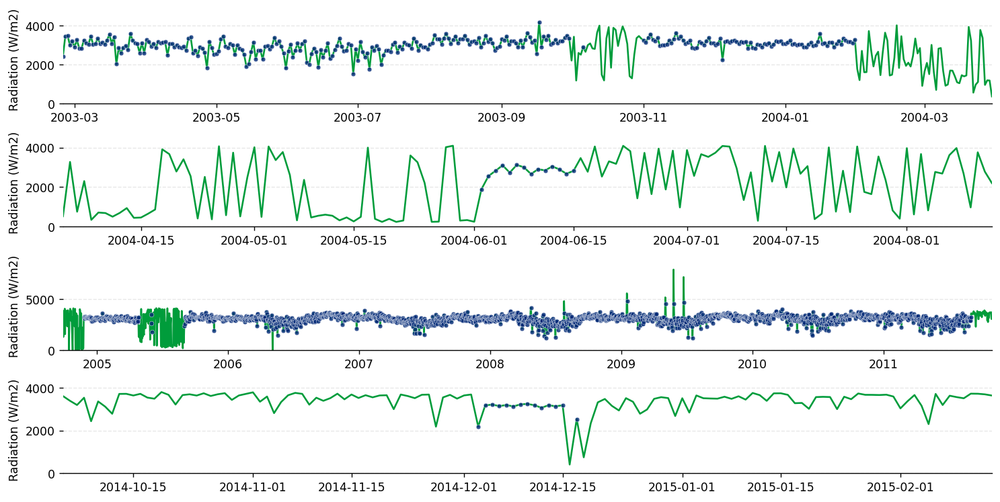

In [71]:
plot_select_weather(
    df_weather_melt=weather_melt_after,
    state=data_integrity_inspect.iloc[0, 0],
    var=data_integrity_inspect.iloc[0, 1],
    mode='imputed',
    value_ref=25,
    days=60,
    indice=None,
    ratio=1)

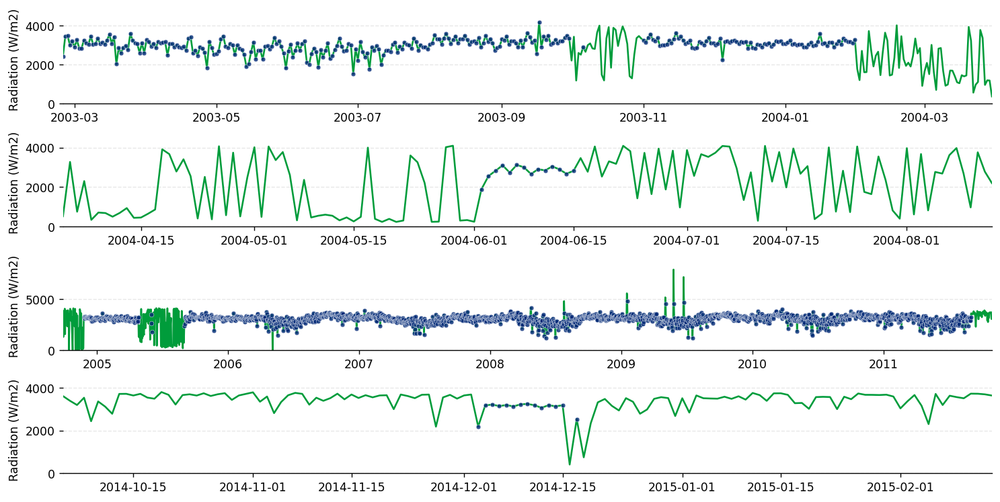

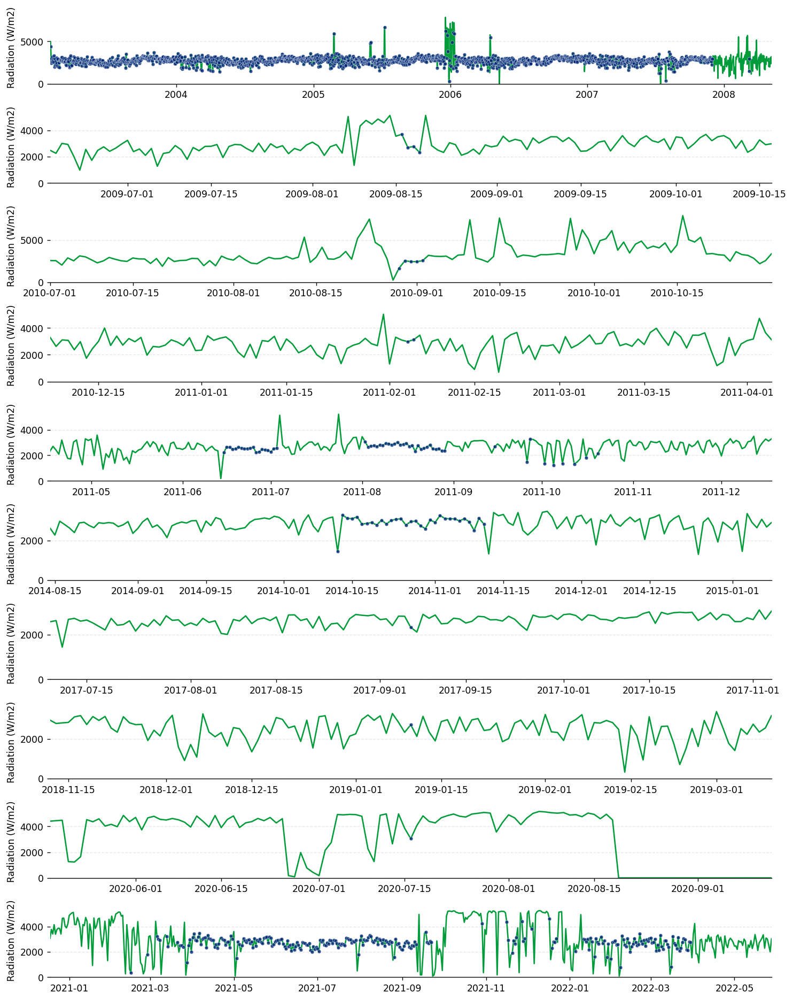

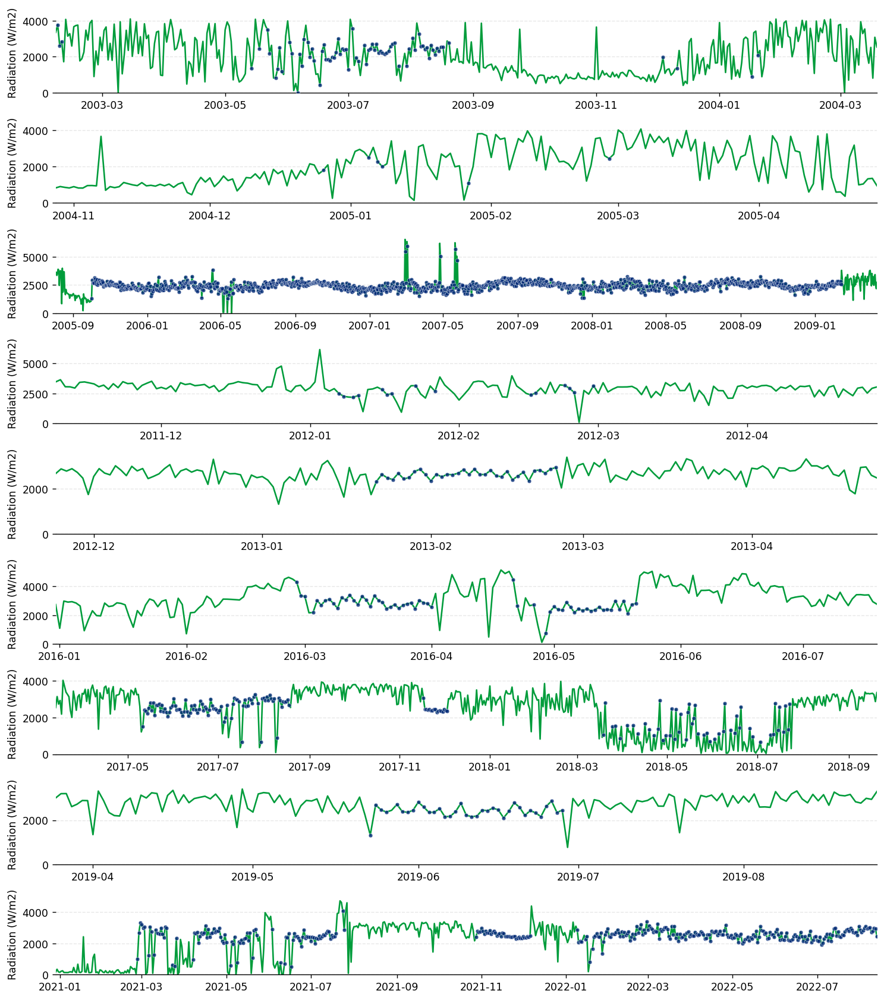

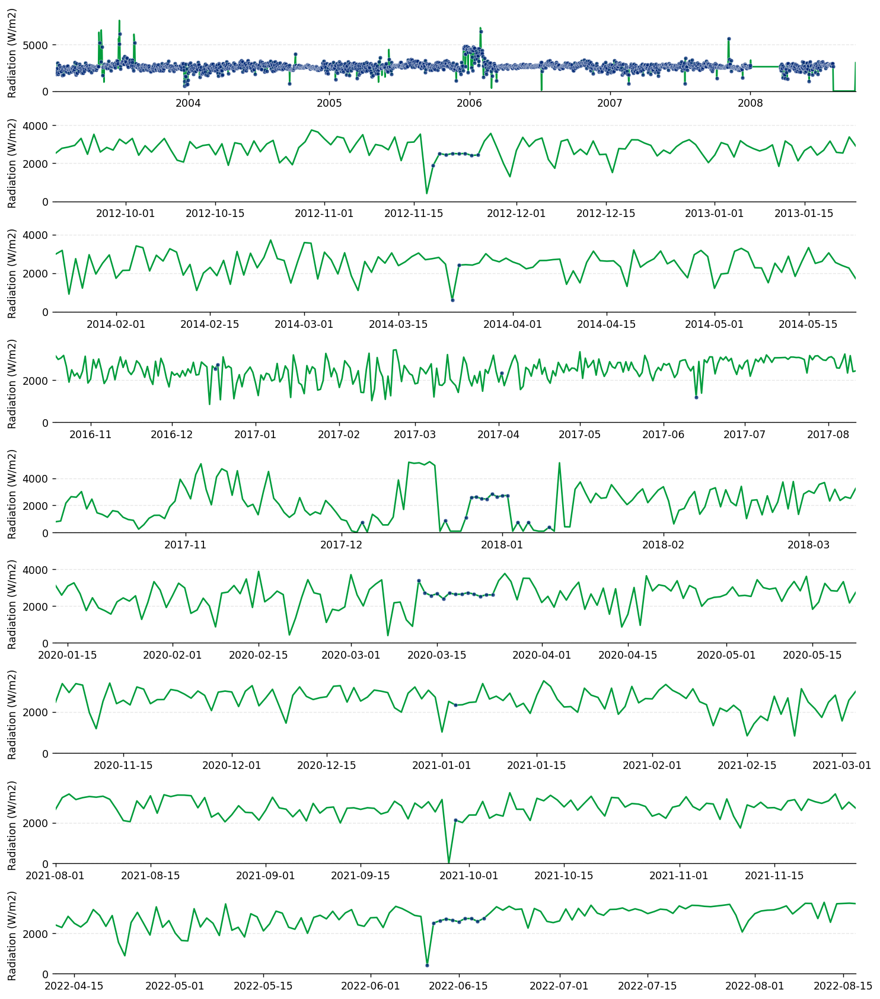

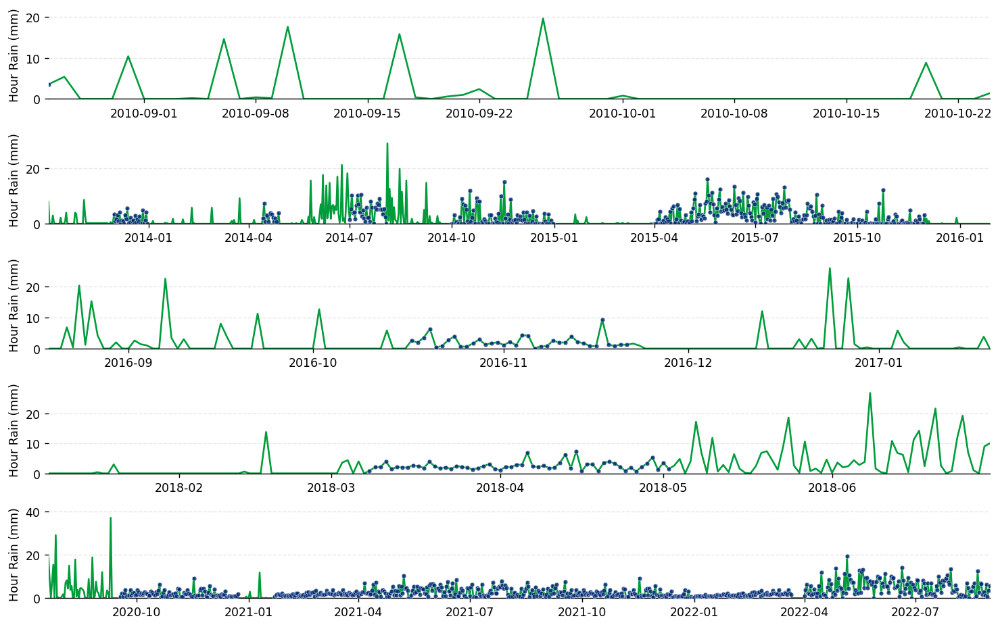

...

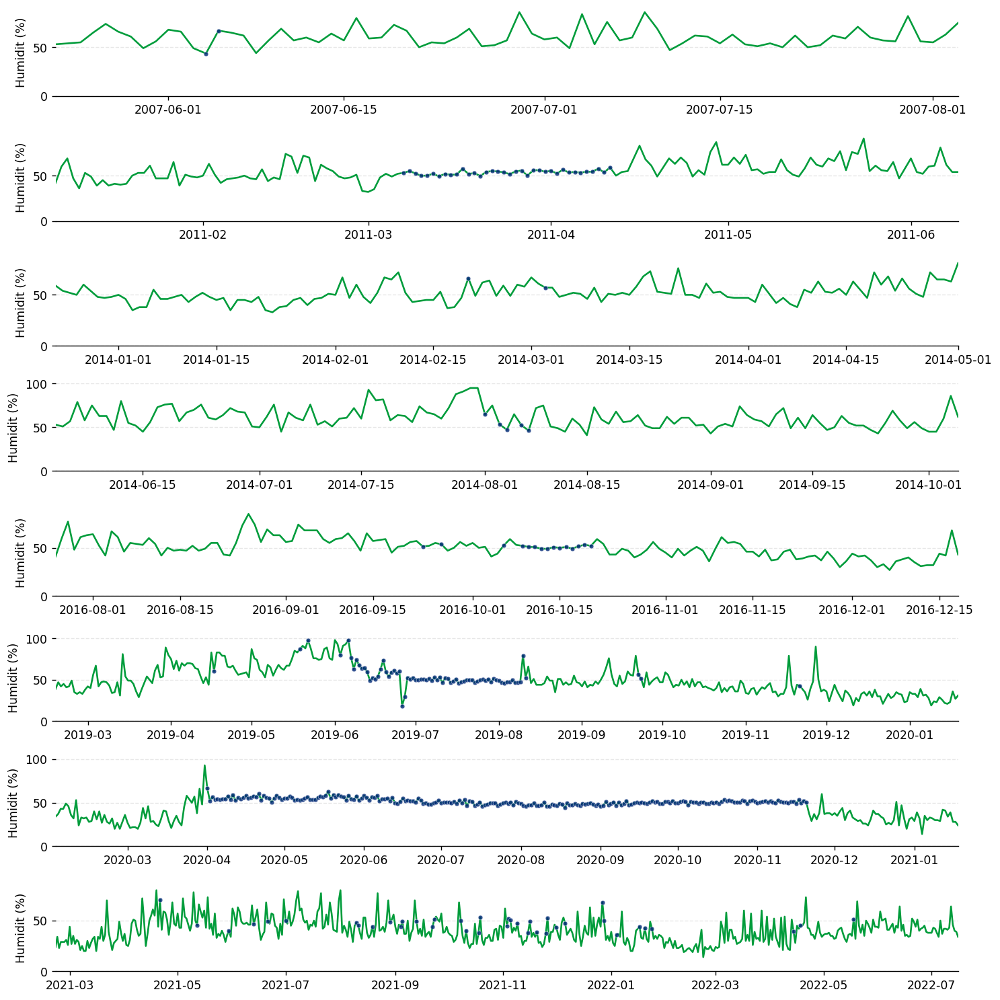

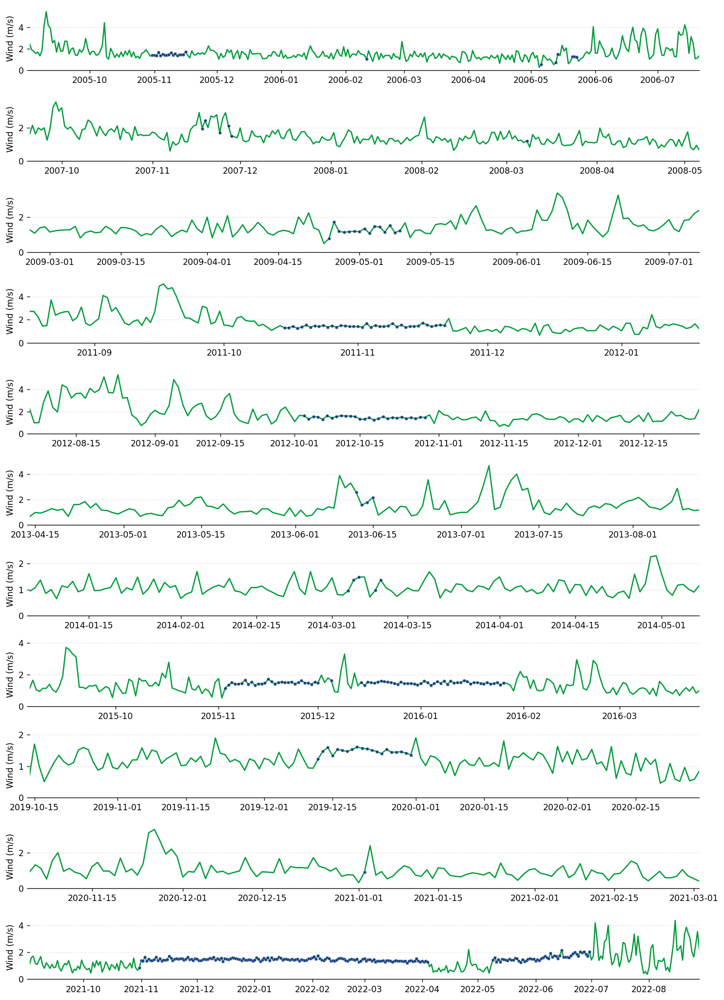

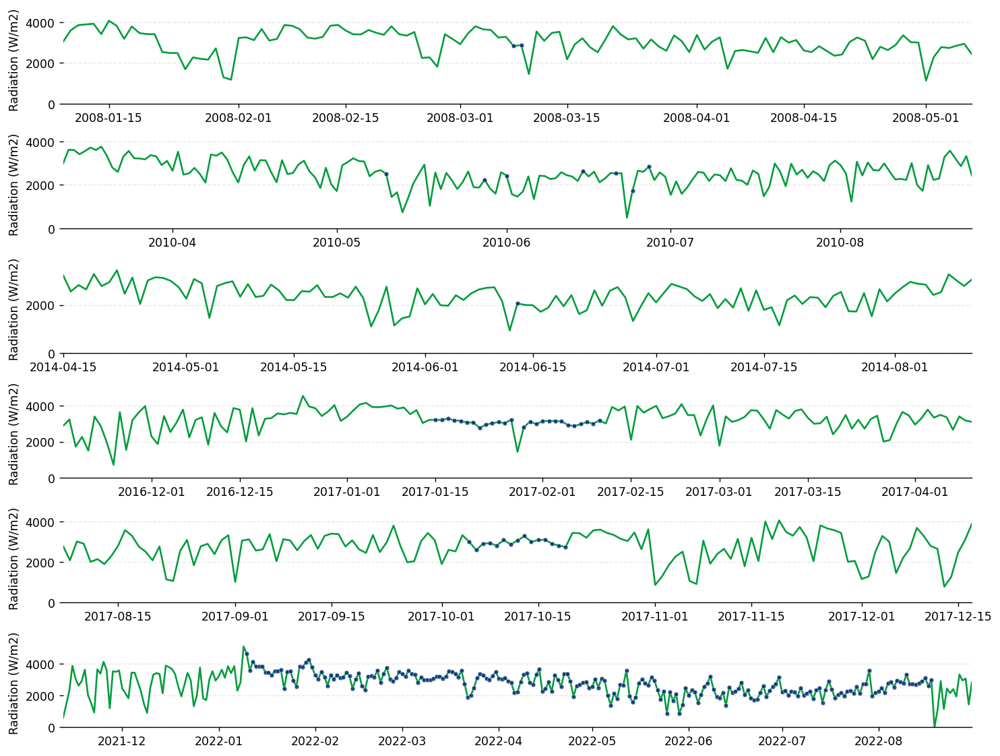

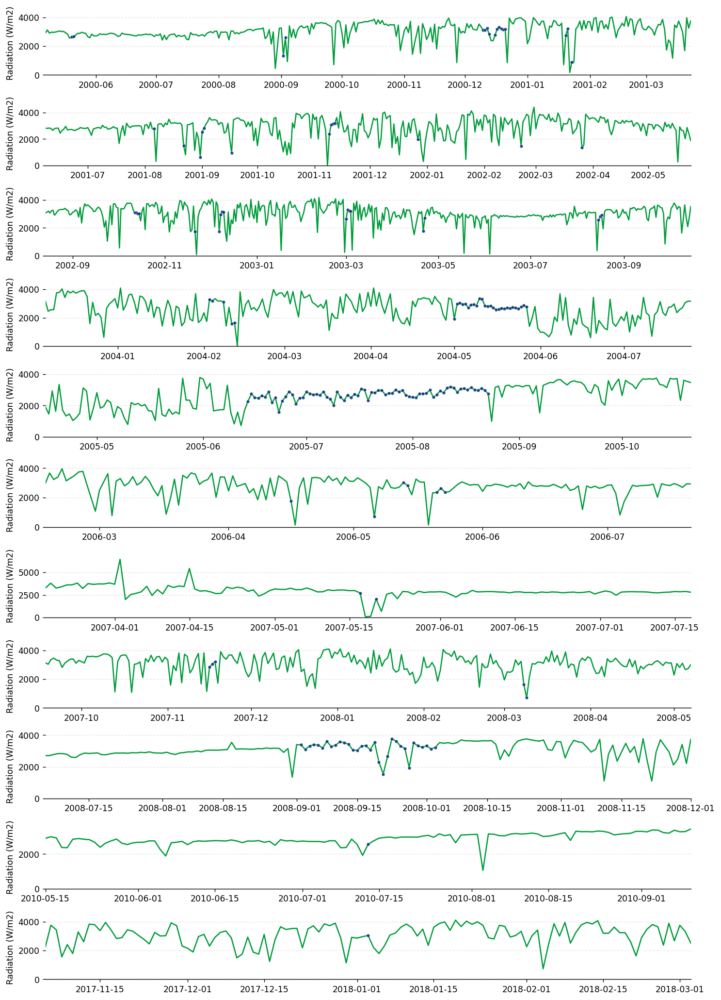

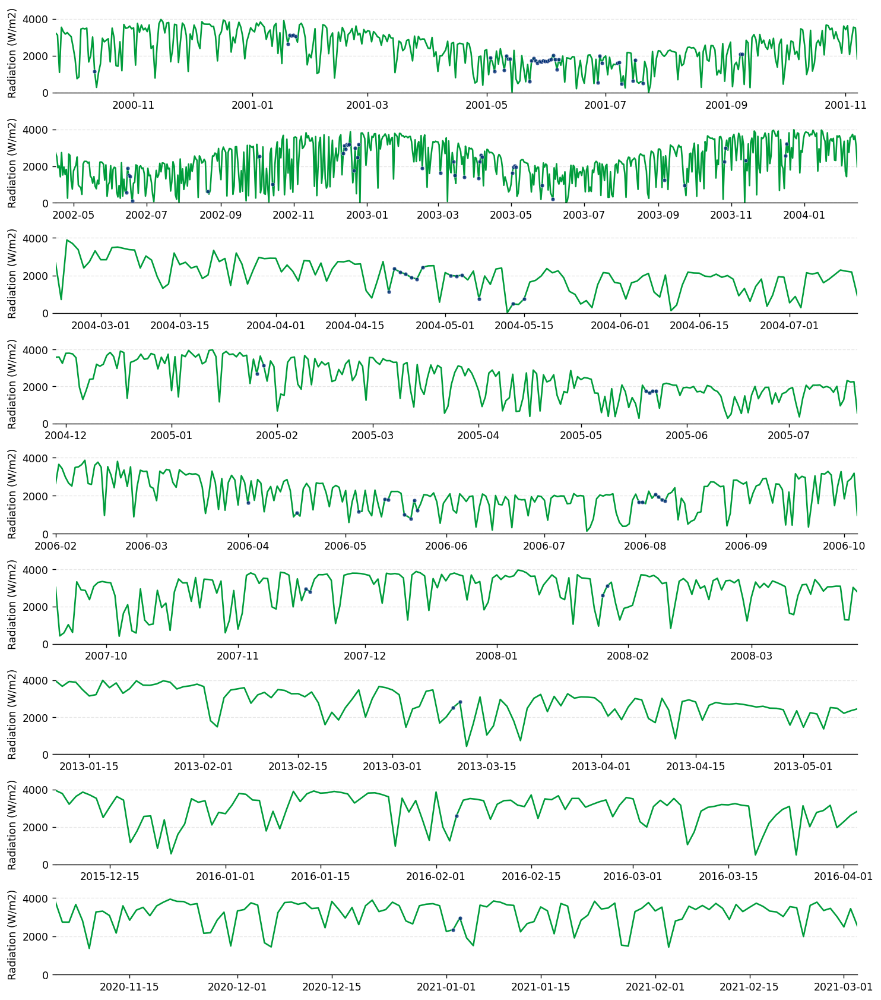

In [72]:
for i, row in data_integrity_inspect.iterrows():
    plot_select_weather(
        df_weather_melt=weather_melt_after,
        state=row["States"],
        var=row["Variables"],
        mode='imputed',
        value_ref=25,
        days=60,
        indice=f"6.2.{i+1}",
        ratio=1)

# 7. Discussion

Analyzing the previous plots, we will see that for long periods with missing data, iterative imputer sometimes does not work well. However, the results are great for short periods. Althought, seting up a metric to evaluate the quality of imputation is very important, an graphic analysis is also very important.

One topic that we do not touch before is resource consumption. Any change in `estimator`, `max_iter`, and `n_nearest_features` will increase the processing resources and sometimes this increase is not translated into a better results.

Talking now about the estimator, as [Yury Kashnitsky](https://yorko.github.io/) said on his [open Machine Learning course](https://mlcourse.ai/book/index.html): *generally, tree-based models handle trends in data poorly when compared with linear models. In that case, you would have to detrend your series first or use some tricks to make the magic happen. Ideally, you can make the series stationary and then use XGBoost. For example, you can forecast trend separately with a linear model and then add predictions from xgboost to get a final forecast.*

We saw this situation when we tried Random Forest and XGBoost and the best results were seen with linear regressor.

Other option to impute data is the `pandas.DataFrame.fillna` method. One interesting parameter on this method is the `limit`, where you can choose the maximum number of consecutive NaN values to impute.

# 8. Final notes

As we could see, iterative imputer is a great choice to improve data integrity. However, it is very important to evaluate graphically and mathematically before use the data. Another alternative than `IterativeImputer` and `pandas.DataFrame.fillna` is to build the data imputation algorithm manually considering our needs. However, this type of strategy can be expensive and not show satisfactory results.